<a href="https://colab.research.google.com/github/minnagam-pkv/minnagam-rag-1/blob/main/startup_school_week_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Welcome to [Goo.gle/LuisLab](https://goo.gle/LuisLab)

# 1.0 - Introduction

This Colab notebook guides developers through various exercises intended to educate the reader on how to begin building Generative AI applications powered by Google Gemini and Vertex AI on Google Cloud.

Exercises include:

1.   Setup
2.   Using the Google Gen AI SDK: Text Prompts & Image Generation
3.   Alternate APIs via OpenAI Compatibility or LiteLLM
4.   Structured Output
5.   Function Calling
6.   Grounding with Google Search
7.   Processing Web Pages
8.   Build an Agent with Gemini & CrewAI



# 2.0 - Initial Setup

## Pre-requisites

### 1. Create a Google Cloud account and (optional) organization:
* https://cloud.google.com/free
* https://cloud.google.com/docs/get-started

### 2. Create a GCP Project
* https://console.cloud.google.com/projectcreate
* Take note of the new project's ID.

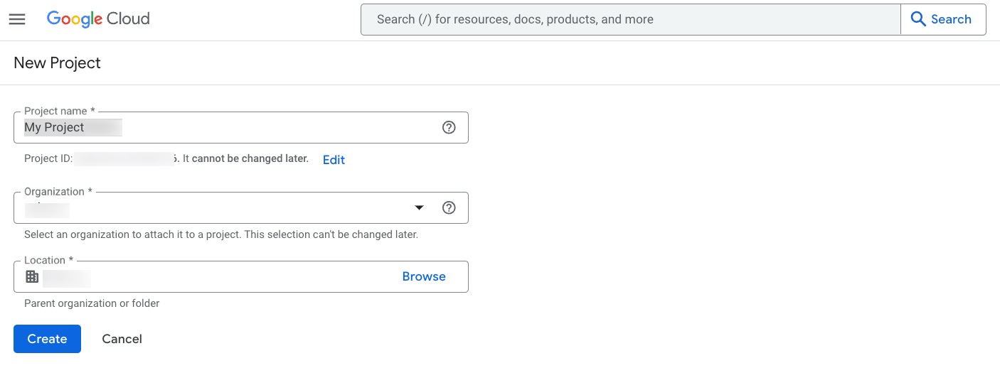

### 3. Select the Project and Search for Vertex AI
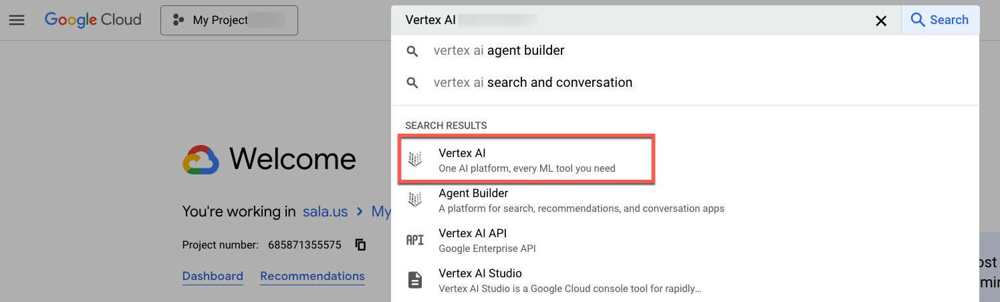

### 4. Enable Recommended APIs
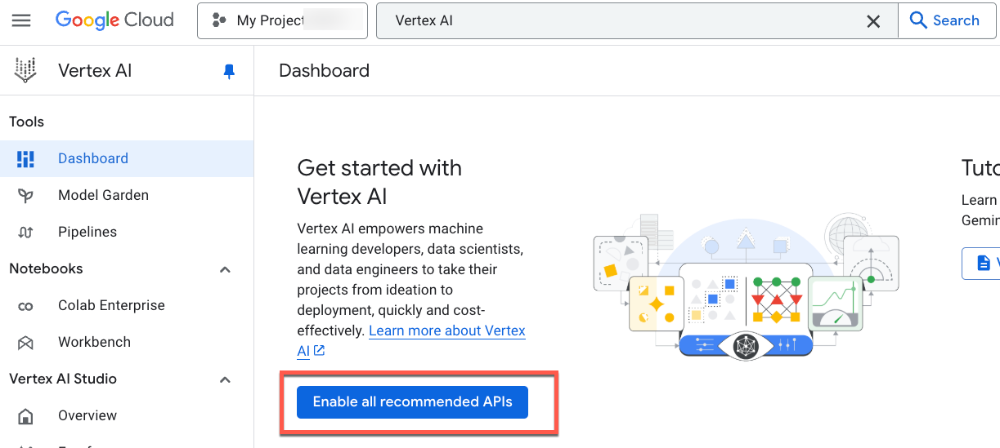

### 5. Test Vertex AI Studio
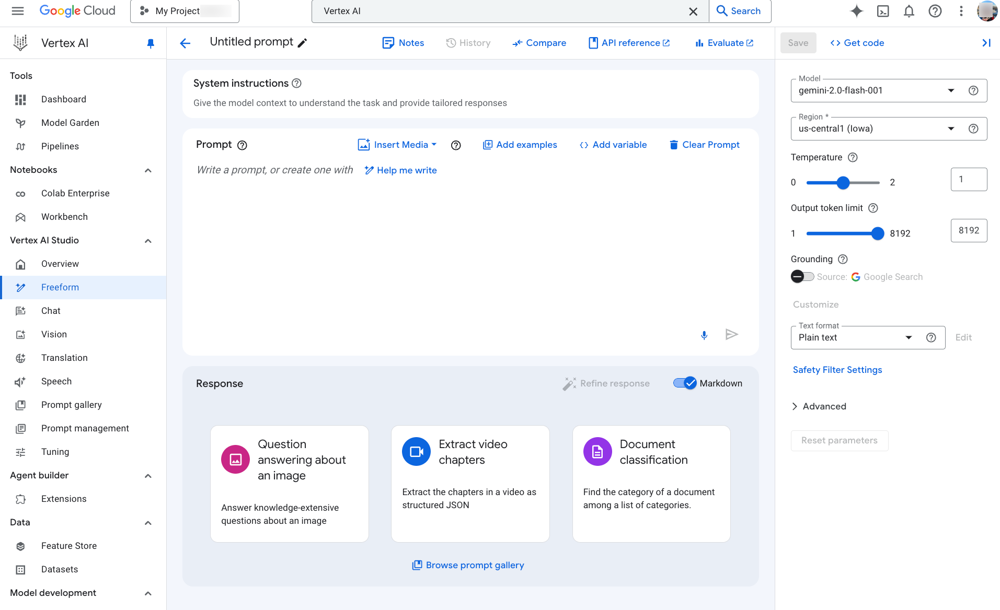

## Install Dependencies

In [ ]:
!pip install -U -q google-genai
!pip install -U -q google-cloud-storage
!pip install -U -q playwright
!pip install -U -q requests
!pip install -U -q openai
!pip install -U -q google-auth
!playwright install --with-deps chromium
!pip install -U -q google-adk ## make sure this is the recent version
!pip install -U -q crewai-tools
!pip install -U -q --force-reinstall google-cloud-aiplatform[agent_engines]

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 159.7/159.7 kB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 174.9/174.9 kB 3.9 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-cloud-aiplatform 1.88.0 requires google-cloud-storage<3.0.0,>=1.32.0, but you have google-cloud-storage 3.1.0 which is incompatible.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.2/45.2 MB 18.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 661.2/661.2 kB 10.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 212.3/212.3 kB 3.9 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires google-auth==2.38.0, but you have google-auth 2.39.0 which is incompatible.
google

## Restart the Colab Session

To use the newly installed packages in this Colab runtime, you must restart the runtime. You can do this by running the cell below, which restarts the current kernel.

The restart might take a minute or longer. After it's restarted, continue to the next step.

Technically optional since Colab should prompt to restart the session after installing the dependencies above.

In [ ]:
import IPython

app = IPython.Application.instance()
app.kernel.do_shutdown(True)

{'status': 'ok', 'restart': True}

## Authenticate with Google Cloud (Colab Only)
Google Colab projects can authenticate against Google Cloud via the following calls. It is not required if running on Colab Enterprise or Vertex AI Workbench.

Running the cell below sets up the "[Application Default Credentials](https://cloud.google.com/docs/authentication/provide-credentials-adc)." which are used by our SDKs to automatically authenticate against Google Cloud Services.

In short, this is equivalent to the following gcloud CLI commands:
```bash
$ gcloud auth login
$ gcloud auth application-default login
```

An authentication pop-up will appear, please accept the permissions before proceeding.

### Alternative: Using Gemini API Keys
Some of these code samples will only work with a Google Cloud account, but the basic Gemini SDK will also work via an API key that can be obtained from [Google AI Studio](https://aistudio.google.com).

**Steps:**
1. Get an API key from: https://aistudio.google.com/app/apikey
2. Create a Colab "secret" called `AI_STUDIO_API_KEY` in the "Secrets" tab on the left hand side of Colab.
3. Make sure that `PROJECT_ID` *is not* defined. This ensures that AI Studio's API key will be used instead.

In [ ]:
from google.colab import userdata
from google.colab import auth
import sys

# Leave PROJECT_ID Blank to use an API Key instead
PROJECT_ID = "luissala-vertex-sandbox" # @param {type: "string"}
LOCATION = "us-central1" # @param {type: "string"}
# BUCKET = "" # @param{type:"string"}

if "google.colab" in sys.modules:
    from google.colab import auth
    auth.authenticate_user(project_id=PROJECT_ID)

## Enable Google Cloud Services

In [ ]:
# !gcloud services enable \
# cloudresourcemanager.googleapis.com \
# aiplatform.googleapis.com \
# documentai.googleapis.com \
# notebooks.googleapis.com \
# visionai.googleapis.com \
# storage-component.googleapis.com \
# cloudaicompanion.googleapis.com \
# discoveryengine.googleapis.com \
# --project {PROJECT_ID}

# 3.0 - Using the Google Gen AI SDK

- **SDK Documentation:** https://googleapis.github.io/python-genai
- **Github Source Code:** https://github.com/googleapis/python-genai

## Model Options
This code sample includes Gemini 2.0, 1.5, and Meta Llama 3


## Quick Example


### Initialize the Client Library
We initialize the client by first determining whether or not to use Vertex AI by checking if "PROJECT_ID" is empty.

In [ ]:
from google import genai
from google.genai import types
from IPython.display import Markdown

# Initialize the client by first determining whether or not to use Vertex AI
# by checking if "PROJECT_ID" is empty.
if PROJECT_ID == "":
  GOOGLE_API_KEY=userdata.get('AI_STUDIO_API_KEY')
  client = genai.Client(api_key=GOOGLE_API_KEY)
else:
  client = genai.Client(project=PROJECT_ID, location="us-central1", vertexai=True)

### Call Gemini 2.0 Flash

In [ ]:
response = client.models.generate_content(
    model="gemini-2.0-flash-001",
    contents="What's the largest planet in our solar system? Tell me 3 facts about it."
)

Markdown(response.text)

The largest planet in our solar system is **Jupiter**.

Here are three facts about Jupiter:

1.  **The Great Red Spot:** Jupiter is famous for its Great Red Spot, a persistent anticyclonic storm larger than Earth. This storm has been raging for at least 350 years, possibly longer.
2.  **It has dozens of moons:** Jupiter has a large number of moons – currently, 95 have been confirmed. The four largest, known as the Galilean moons (Io, Europa, Ganymede, and Callisto), were discovered by Galileo Galilei in 1610.
3.  **It's a gas giant:** Jupiter is primarily composed of hydrogen and helium, similar to the composition of the Sun. It lacks a solid surface; instead, it has swirling clouds and a dense atmosphere that transitions into a liquid metallic hydrogen ocean deep within.


## View the Response object

Note `usage_metadata` which includes token counts (useful when estimating costs)


In [ ]:
print(response.model_dump_json(indent=2))

{
  "candidates": [
    {
      "content": {
        "parts": [
          {
            "video_metadata": null,
            "thought": null,
            "code_execution_result": null,
            "executable_code": null,
            "file_data": null,
            "function_call": null,
            "function_response": null,
            "inline_data": null,
            "text": "The largest planet in our solar system is **Jupiter**.\n\nHere are 3 facts about it:\n\n1.  **Great Red Spot:** Jupiter is famous for its Great Red Spot, a persistent anticyclonic storm that is larger than Earth. This storm has been raging for at least 350 years, and possibly much longer!\n\n2.  **It's a Gas Giant:** Jupiter is primarily composed of hydrogen and helium, making it a gas giant. It doesn't have a solid surface like Earth; instead, it has swirling clouds and a gradually denser atmosphere as you move deeper into the planet.\n\n3.  **It Has a Strong Magnetic Field:** Jupiter has the strongest planetary

### Chat with a Model (Bonus: Streaming Content)
The previous examples use `client.models.generate_content()` but one can use `client.chats.create()` to create a chat that inherently remembers past conversations, effectively giving the model a "memory" as "big" as the context window.

This example also demonstrates streaming by printing out the chunks as they arrive.

**Learn more at:** https://googleapis.github.io/python-genai/#chats

In [ ]:
chat = client.chats.create(model='gemini-2.0-flash-001')
for chunk in chat.send_message_stream("Tell me 3 facts about Jupiter and its moons"):
    print(chunk.text, end="")

Okay, here are three facts about Jupiter and its moons:

1.  **Jupiter has the largest moon in the solar system, Ganymede:** Ganymede is so large that it's bigger than the planet Mercury! It's also the only moon in the solar system known to have its own magnetosphere.

2.  **Europa has a subsurface ocean potentially containing more water than Earth:** Scientists believe Europa has a saltwater ocean hidden beneath a thick icy crust. This ocean is considered a prime candidate in the search for extraterrestrial life.

3.  **Io is the most volcanically active world in the solar system:** Io's surface is constantly being reshaped by hundreds of active volcanoes, driven by tidal forces from Jupiter and other moons. These volcanoes spew sulfurous compounds high into space, contributing to Jupiter's magnetosphere.


#### Chat "Memory" Test

Here we use the same `chat` instance to continue the conversation, which demonstrates that the message history is stored by the chat instance.

In this case, the model should return additional information about Jupiter.

In [ ]:
for chunk in chat.send_message_stream("Tell me more..."):
    print(chunk.text, end="")

Okay, let's delve a little deeper into each of those facts, providing some more details:

**1. Ganymede: The Giant with a Magnetosphere**

*   **Size Matters:** Ganymede's diameter is approximately 5,268 kilometers (3,273 miles). That's about 26% larger than Mercury by diameter, and about 8% more massive. If Ganymede orbited the Sun instead of Jupiter, it would easily qualify as a planet.
*   **Magnetosphere Mystery:** Ganymede's magnetosphere is embedded *within* Jupiter's much larger magnetosphere. This creates a complex interplay of magnetic fields. Scientists are still studying how Ganymede's magnetosphere is generated and how it interacts with Jupiter's.
*   **Subsurface Ocean:** Like Europa, Ganymede is also believed to have a subsurface ocean, potentially sandwiched between layers of ice. However, its ocean is thought to be much deeper than Europa's and possibly less accessible.
*   **Exploration:** NASA's Juno spacecraft has made close flybys of Ganymede, providing new insights

# Gemini 2.5 & Thinking Budgets

Models with thinking capabilities are available through the Gemini API. Thinking is on by default in both the API and AI Studio because the 2.5 series models have the ability to automatically decide when and how much to think based on the prompt. For most use cases, it's beneficial to leave thinking on.

The `thinkingBudget` parameter gives the model guidance on the number of thinking tokens it can use when generating a response. A greater number of tokens is typically associated with more detailed thinking, which is needed for solving more complex tasks. thinkingBudget must be an integer in the range 0 to 24576. Setting the thinking budget to 0 disables thinking.

Depending on the prompt, the model might overflow or underflow the token budget.

In [ ]:
response = client.models.generate_content(
    model="gemini-2.5-flash-preview-04-17",
    contents="Explain the Occam's Razor concept and provide everyday examples of it",
    config=types.GenerateContentConfig(
        thinking_config=types.ThinkingConfig(thinking_budget=1024) # thinkingBudget must be an integer in the range 0 to 24576
    ),
)

Markdown(response.text)

Okay, let's break down Occam's Razor.

**What is Occam's Razor?**

Occam's Razor is a philosophical principle or rule of thumb that states:

> **Among competing hypotheses, the one with the fewest assumptions should be selected.**

In simpler terms:

> **The simplest explanation is usually the best one.**

It's attributed to the 14th-century English Franciscan friar, philosopher, and theologian William of Ockham (or Occam), although the principle predates him. He used it extensively in his work.

**Key Points about Occam's Razor:**

1.  **It prefers simplicity:** When faced with multiple possible explanations for a phenomenon, it suggests choosing the one that requires the fewest entities, assumptions, steps, or complexities.
2.  **It's a heuristic, not a law of nature:** Occam's Razor is a guide for choosing between theories or explanations, not a guarantee that the simplest one is *always* true. Nature isn't obligated to be simple. However, simpler explanations are often easier to test and falsify, and historically, they have often turned out to be correct.
3.  **"Simplest" means fewest *unnecessary* assumptions:** It's not about choosing the explanation that is easiest to understand, but the one that makes the fewest unsupported leaps or introduces the fewest new, unknown factors.

**Think of it like trimming away unnecessary branches from a tree to get to the core.** If two theories explain the same set of facts equally well, the one that doesn't require you to invent extra "stuff" (like magical forces, hidden motives, or complex interactions you can't observe) is generally preferred.

**Everyday Examples of Occam's Razor:**

Here are some common situations where the principle applies:

1.  **Missing Keys:**
    *   **Situation:** You can't find your car keys.
    *   **Complex Explanation:** Your mischievous neighbor snuck into your house while you were sleeping and hid them as a prank.
    *   **Simple Explanation:** You misplaced them, and they are likely somewhere common, like under a cushion or on a table you don't usually use.
    *   **Occam's Razor:** The simple explanation (misplaced) requires far fewer assumptions (break-in, neighbor's motive, stealth) and is therefore the more likely one to investigate first.

2.  **Computer Not Working:**
    *   **Situation:** Your computer screen is black, and it won't turn on.
    *   **Complex Explanation:** There was a power surge last night that fried the motherboard and also corrupted the operating system, and now a specific virus is preventing it from booting.
    *   **Simple Explanation:** The computer is unplugged, or the power strip is turned off.
    *   **Occam's Razor:** Check the simple things first (is it plugged in?) because this requires the fewest assumptions about hardware failure, viruses, etc.

3.  **Friend Doesn't Reply to a Text:**
    *   **Situation:** You sent a friend a text, and they haven't replied for hours.
    *   **Complex Explanation:** They are secretly angry at you, planning to cut you out of their life, and are deliberately ignoring you to send a message.
    *   **Simple Explanation:** They are busy, sleeping, in a meeting, didn't see the text, or their phone died.
    *   **Occam's Razor:** The simple explanation is much more likely and requires fewer assumptions about your friend's feelings and intentions.

4.  **Strange Noise at Night:**
    *   **Situation:** You hear a scratching sound from the wall late at night.
    *   **Complex Explanation:** It's a ghost trying to communicate with you from beyond the grave.
    *   **Simple Explanation:** It's likely a small animal (mouse, insect) in the wall or plumbing noise.
    *   **Occam's Razor:** The animal/plumbing explanation is far simpler and more probable than invoking supernatural entities.

5.  **A Child's Broken Toy:**
    *   **Situation:** A toy is broken.
    *   **Complex Explanation:** A sibling carefully sabotaged it with tiny tools they smuggled into the house, while simultaneously distracting the child who owned it using a pre-planned diversion.
    *   **Simple Explanation:** The child (or another child) played too roughly with it and accidentally broke it.
    *   **Occam's Razor:** The accidental breakage is the simplest explanation involving the fewest steps and hidden motives.

In essence, Occam's Razor encourages you to look for the most straightforward explanation that fits the known facts, before resorting to more complicated theories that introduce extra variables or unknowns.

### Let's try Llama!
The same function can access other hosted pay-as-you-go (PAYG) models!

**Note:** Llama 3.1 will need to be enabled via [Model Garden](https://console.cloud.google.com/vertex-ai/publishers/meta/model-garden/llama-3.1-405b-instruct-maas)

In [ ]:
response = client.models.generate_content(
    model="meta/llama-3.1-8b-instruct-maas",
    contents="What's the largest planet in our solar system? Tell me 3 facts about it."
)

Markdown(response.text)

The largest planet in our solar system is Jupiter. Here are three interesting facts about it:

1. **Massive Size**: Jupiter is the largest of all the planets in terms of both mass and size. It has a diameter of approximately 142,984 kilometers (88,846 miles), which is more than 11 times the diameter of the Earth.

2. **Atmospheric Composition**: Jupiter's atmosphere is primarily composed of hydrogen (about 75%) and helium (about 24%). It also contains smaller amounts of other gases, including methane, ammonia, and water vapor. The planet's atmosphere is known for its vibrant cloud bands, which are made up of different types of clouds and hazes.

3. **Moons and Magnetic Field**: Jupiter has a total of 92 confirmed moons, with four of them being particularly large: Io, Europa, Ganymede, and Callisto. These moons are known as the Galilean moons, as they were discovered by Galileo Galilei in 1610. Jupiter also has a very strong magnetic field, which is powered by its rapid rotation and convection in the planet's liquid metal hydrogen core. This magnetic field is so strong that it traps charged particles from the solar wind, creating a region around Jupiter known as the magnetosphere.

### System Instructions & Advanced Configuration
This example uses customized safety settings and generation configuration.

In [ ]:
from IPython.display import Markdown

# The default safety settings should be sufficient for most scenarios.
# Optionally, developers can customize the safety settings.
# Learn more at:
# - https://googleapis.github.io/python-genai/index.html#safety-settings
# - https://cloud.google.com/vertex-ai/generative-ai/docs/learn/responsible-ai
CUSTOM_SAFETY_SETTINGS = [
    types.SafetySetting(
        category="HARM_CATEGORY_HATE_SPEECH",
        threshold="BLOCK_ONLY_HIGH",
    ),
    types.SafetySetting(
        category="HARM_CATEGORY_DANGEROUS_CONTENT",
        threshold="BLOCK_ONLY_HIGH",
    ),
    types.SafetySetting(
        category="HARM_CATEGORY_SEXUALLY_EXPLICIT",
        threshold="BLOCK_ONLY_HIGH",
    ),
    types.SafetySetting(
        category="HARM_CATEGORY_HARASSMENT",
        threshold="BLOCK_ONLY_HIGH",
    ),
]

# Create a custom generation config to customize settings, such as temperature,
# response type, etc.
# - https://googleapis.github.io/python-genai/index.html#typed-config
MODEL_ID= 'gemini-2.0-flash-001' # @param ["gemini-2.0-flash-001", "gemini-2.0-flash-lite-preview-02-05", "gemini-2.0-pro-exp-02-05","gemini-2.0-flash-thinking-exp-01-21", "gemini-1.5-flash-002", "gemini-1.5-pro-002", "meta/llama-3.2-90b-vision-instruct-maas", "meta/llama-3.1-405b-instruct-maas","meta/llama-3.1-70b-instruct-maas","meta/llama-3.1-8b-instruct-maas"]
TEMPERATURE= 1 # @param {type:"slider", min:0, max:2, step:0.01}
TOP_P = 0.95 # @param {type:"slider", min:0, max:1, step:0.05}
TOP_K = 40 # @param {type:"slider", min:1, max:40, step:1}
MAX_OUTPUT_TOKENS = 8192 # @param {type:"slider", min:64, max:8192, step:64}
RESPONSE_TYPE = 'text/plain' # @param ["text/plain", "application/json'"]
SYSTEM_INSTRUCTION = "Speak like Shakespeare. Format your responses in markdown. Use lots of emoji." # @param {type:"string"}
PROMPT = "Tell me 3 facts about Jupiter." # @param {type:"string"}
BUCKET = ""

CUSTOM_GENERATION_CONFIG = {
    "max_output_tokens": MAX_OUTPUT_TOKENS,
    "temperature": TEMPERATURE,
    "top_p": TOP_P,
    "top_k": TOP_K,
    "safety_settings": CUSTOM_SAFETY_SETTINGS,
    "responseMimeType": RESPONSE_TYPE,
    "system_instruction": SYSTEM_INSTRUCTION
}

response = client.models.generate_content(
    model=MODEL_ID,
    config=CUSTOM_GENERATION_CONFIG,
    contents=PROMPT
)

Markdown(response.text)

Hark! Attend and I shall regale thee with three celestial tidbits concerning Jove, mightiest of planets! 🪐👑

1.  **A Great Red Spot Doth Rage!** 🌪️ Jupiter boasts a storm, a swirling vortex of crimson fury, known as the Great Red Spot. This tempest, larger than our very Earth, hath been observed for centuries, a testament to Jupiter's volatile nature! 😡
    
2.  **Many Moons He Doth Command!** 🌙 Jupiter doth reign over a vast court of moons, a multitude to behold! Of these, the Galilean moons—Io, Europa, Ganymede, and Callisto—are the most renowned, discovered by Galileo himself! 🔭🌟
    
3.  **A King of Gas He Is!** 💨 Jupiter is a gas giant, composed primarily of hydrogen and helium. Unlike our own Earth, it lacks a solid surface, a swirling sphere of immense power and majesty! 🌬️✨


---
---

# 4.0 - Alternate APIs & SDKS

Vertex-hosted models can be accessed via an OpenAI-compatible completions API, which means that any OpenAI-compatible SDK *should* work with Gemini and other Vertex Model Garden-hosted models.

## OpenAI-Compatible API
The [Gemini Chat Completions API](https://cloud.google.com/vertex-ai/generative-ai/docs/multimodal/call-vertex-using-openai-library) is an OpenAI compatible API that uses OAuth to authenticate with a short-lived access token.

By default, access tokens last for 1 hour. You can extend the life of your access token or periodically refresh your token and update the OPENAI_API_KEY environment variable.

In [ ]:
from google.auth import default
import google.auth.transport.requests
import openai


# Programmatically get an access token
credentials, _ = default(scopes=["https://www.googleapis.com/auth/cloud-platform"])
credentials.refresh(google.auth.transport.requests.Request())

# OpenAI Client
openai_client = openai.OpenAI(
    base_url=f"https://{LOCATION}-aiplatform.googleapis.com/v1/projects/{PROJECT_ID}/locations/{LOCATION}/endpoints/openapi",
    api_key=credentials.token,
)

response = openai_client.chat.completions.create(
    model="google/gemini-2.0-flash-001",
    messages=[{"role": "user",
               "content": "Tell me 3 facts about Jupiter and its moons?"
               }],
)

print(response.to_json(indent=2))
print("---")
Markdown(response.choices[0].message.content)

{
  "id": "2025-04-23|13:01:13.095789-07|7.229.138.53|-1808262836",
  "choices": [
    {
      "finish_reason": "stop",
      "index": 0,
      "logprobs": null,
      "message": {
        "content": "Okay, here are 3 facts about Jupiter and its moons:\n\n1.  **Jupiter has the largest moon in the Solar System:** Jupiter's moon Ganymede is not only the largest moon orbiting Jupiter, but it's also the largest moon in the entire Solar System. It's even bigger than the planet Mercury! Ganymede is so large that it even has its own magnetic field.\n\n2.  **Io is the most volcanically active world in the Solar System:** Another of Jupiter's moons, Io, is covered in hundreds of active volcanoes. These volcanoes spew out sulfur and sulfur dioxide, giving Io a colorful, mottled appearance. The intense volcanic activity is caused by tidal forces from Jupiter and the other Galilean moons (Europa, Ganymede, and Callisto).\n\n3.  **Europa may have a liquid water ocean beneath its icy surface:** Euro

Okay, here are 3 facts about Jupiter and its moons:

1.  **Jupiter has the largest moon in the Solar System:** Jupiter's moon Ganymede is not only the largest moon orbiting Jupiter, but it's also the largest moon in the entire Solar System. It's even bigger than the planet Mercury! Ganymede is so large that it even has its own magnetic field.

2.  **Io is the most volcanically active world in the Solar System:** Another of Jupiter's moons, Io, is covered in hundreds of active volcanoes. These volcanoes spew out sulfur and sulfur dioxide, giving Io a colorful, mottled appearance. The intense volcanic activity is caused by tidal forces from Jupiter and the other Galilean moons (Europa, Ganymede, and Callisto).

3.  **Europa may have a liquid water ocean beneath its icy surface:** Europa is one of the most promising places in our solar system to search for potential life beyond Earth. Scientists believe that beneath its icy crust lies a vast ocean of liquid water, kept warm by tidal forces from Jupiter. This ocean could potentially harbor conditions suitable for life.


---
---

## Using LiteLLM
[LiteLLM](https://docs.litellm.ai/docs/) is a **Python library and SDK** designed to simplify the integration and usage of various large language model (LLM) APIs. It provides a unified interface to access over 100 LLM services from providers such as OpenAI, Azure, HuggingFace, Cohere, and more.

Key features include:
- **Efficiency and Scalability**: LiteLLM addresses the limitations of traditional large-scale language models by focusing on performance and scalability, making it suitable for diverse applications in natural language processing (NLP).
- **Unified API Gateway**: It acts as a proxy server, enabling developers to call multiple LLM APIs in a standardized OpenAI-compatible format.
- **Structured Outputs**: LiteLLM supports generating structured, type-safe outputs across different LLM providers, enhancing usability and consistency.

This makes LiteLLM a powerful tool for developers looking to streamline their interaction with multiple LLM platforms.


### Authenticating with LiteLLM
LiteLLM natively supports Application Default Credentials, but also supports Service Accounts. Refer to the [LiteLLM documentation](https://docs.litellm.ai/docs/providers/vertex) for more details.

In [ ]:
from litellm import completion

## COMPLETION CALL
response = completion(
  model="vertex_ai/gemini-2.0-flash-001",
  messages=[{
             "content": "Tell me three facts about Jupiter",
             "role": "user"
             }],
)

print(response.to_json(indent=2))
print("---")
Markdown(response.choices[0].message.content)

{
  "id": "chatcmpl-14fb1d00-a324-4af1-a70e-29c9a73fb597",
  "created": 1745438479,
  "model": "gemini-2.0-flash-001",
  "object": "chat.completion",
  "system_fingerprint": null,
  "choices": [
    {
      "finish_reason": "stop",
      "index": 0,
      "message": {
        "content": "Okay, here are three facts about Jupiter:\n\n1.  **Jupiter is the largest planet in our solar system:** It's so massive that you could fit all the other planets inside it, with room to spare! Its mass is more than twice the combined mass of all the other planets.\n\n2.  **Jupiter has a giant storm called the Great Red Spot that has been raging for centuries:** This storm is larger than Earth and has been observed for at least 350 years. Its exact cause and future are still being studied.\n\n3.  **Jupiter has a strong magnetic field:** This magnetic field is about 20,000 times stronger than Earth's and creates intense belts of radiation around the planet. It also causes auroras at Jupiter's poles, simil

Okay, here are three facts about Jupiter:

1.  **Jupiter is the largest planet in our solar system:** It's so massive that you could fit all the other planets inside it, with room to spare! Its mass is more than twice the combined mass of all the other planets.

2.  **Jupiter has a giant storm called the Great Red Spot that has been raging for centuries:** This storm is larger than Earth and has been observed for at least 350 years. Its exact cause and future are still being studied.

3.  **Jupiter has a strong magnetic field:** This magnetic field is about 20,000 times stronger than Earth's and creates intense belts of radiation around the planet. It also causes auroras at Jupiter's poles, similar to the Northern Lights on Earth, but much more powerful.


### LiteLLM Routing for Load Balancing and Fallbacks
This example will load-balance between Gemini in the US and EU and fallback to Llama 3.1.

Learn about LiteLLM Routing [here](https://docs.litellm.ai/docs/routing-load-balancing).

In [ ]:
from litellm import Router
import json

model_list = [{ # list of model deployments
    "model_name": "gemini_2.0", # model alias -> loadbalance between models with same `model_name`
    "litellm_params": { # params for litellm completion/embedding call
        "model": "vertex_ai/gemini-2.0-flash-001", # actual model name
        "vertex_project": PROJECT_ID,
        "vertex_location": "us-central1"
    }
 },
 {
    "model_name": "gemini_2.0", # model alias -> loadbalance between models with same `model_name`
    "litellm_params": { # params for litellm completion/embedding call
        "model": "vertex_ai/gemini-2.0-flash-001", # actual model name
        "vertex_project": PROJECT_ID,
        "vertex_location": "eu-west4"
    }
 },
 {
    "model_name": "llama_3.1",
    "litellm_params": { # params for litellm completion/embedding call
        "model": "vertex_ai/meta/llama-3.1-8b-instruct-maas",
        "vertex_project": PROJECT_ID,
        "vertex_location": "us-central1"
    }
 }]


# Configure fallback
fallbacks=[{"gemini_2.0": ["llama_3.1"]}] # 👈 KEY CHANGE

# Initialize our router
router = Router(model_list=model_list, fallbacks=fallbacks)

# This is analogous to openai.ChatCompletion.create
# Requests with model="gemini_2.0" will pick a deployment where model_name="vertex_ai/gemini-2.0-flash-001"
response = router.completion(
    model="gemini_2.0",
    messages=[{"role": "user", "content": "Tell me 3 facts about Jupiter?"}],
    mock_testing_fallbacks=False
    )

print(response.to_json(indent=2))
print("---")
Markdown(response.choices[0].message.content)

{
  "id": "chatcmpl-b74d7f3e-d04e-4365-9136-8c87d562a72e",
  "created": 1745438480,
  "model": "gemini-2.0-flash-001",
  "object": "chat.completion",
  "system_fingerprint": null,
  "choices": [
    {
      "finish_reason": "stop",
      "index": 0,
      "message": {
        "content": "Okay, here are 3 facts about Jupiter:\n\n1.  **Jupiter is the largest planet in our solar system.** It is so massive that you could fit all the other planets inside of it, and it's more than twice as massive as all the other planets combined!\n\n2.  **Jupiter has a giant storm raging for centuries.** The Great Red Spot is a massive storm, larger than Earth, that has been observed on Jupiter for at least 350 years.\n\n3.  **Jupiter has a strong magnetic field.** This magnetic field is about 20,000 times stronger than Earth's, and it traps charged particles, creating intense radiation belts around the planet.\n",
        "role": "assistant",
        "tool_calls": null,
        "function_call": null
     

Okay, here are 3 facts about Jupiter:

1.  **Jupiter is the largest planet in our solar system.** It is so massive that you could fit all the other planets inside of it, and it's more than twice as massive as all the other planets combined!

2.  **Jupiter has a giant storm raging for centuries.** The Great Red Spot is a massive storm, larger than Earth, that has been observed on Jupiter for at least 350 years.

3.  **Jupiter has a strong magnetic field.** This magnetic field is about 20,000 times stronger than Earth's, and it traps charged particles, creating intense radiation belts around the planet.


# 5.0 - Structured Output
The Gen AI SDK supports [Pydantic](https://pydantic.dev) models for structured output. Note that not all field types are supported.

In [ ]:
from typing import List
from pydantic import BaseModel, Field

class Planet(BaseModel):
  name: str = Field(description="The name of the planet")
  moons: int = Field(description="The number of moons this planet contains or '0' if none.", default=0)

class SolarSystem(BaseModel):
    planets: List[Planet] = Field(..., description="A python list of all planets in the solar system")

# Display the model's JSON schema
SolarSystem.model_json_schema()

{'$defs': {'Planet': {'properties': {'name': {'description': 'The name of the planet',
     'title': 'Name',
     'type': 'string'},
    'moons': {'default': 0,
     'description': "The number of moons this planet contains or '0' if none.",
     'title': 'Moons',
     'type': 'integer'}},
   'required': ['name'],
   'title': 'Planet',
   'type': 'object'}},
 'properties': {'planets': {'description': 'A python list of all planets in the solar system',
   'items': {'$ref': '#/$defs/Planet'},
   'title': 'Planets',
   'type': 'array'}},
 'required': ['planets'],
 'title': 'SolarSystem',
 'type': 'object'}

In [ ]:
solar_system=SolarSystem(planets=[Planet(name="Earth", moons=1)])

solar_system.model_dump_json()

'{"planets":[{"name":"Earth","moons":0}]}'

In [ ]:
response = client.models.generate_content(
    model="gemini-2.0-flash-001",
    contents="List all the planets in the solar system and the number of moons.",
    config=types.GenerateContentConfig(
        response_mime_type='application/json',
        response_schema=SolarSystem,
    ),
)


# The prompt is effectively:
# List all planets and moons and cast each into an instance of Planet where
# name="planet name" and moons="number of moons" and then add those to a SolarSystem
# which is a list of Planets

# TODO: Output complete prompt

# Notice that response.parsed has already been cast as an instance of "SolarSystem"
solar_system = response.parsed
print(f"solar_system is an instance of: {solar_system.__class__.__name__}")
print("---")

# We can now iterate through all the planets
print("Planet List:")
[print(f"{p.name}, {p.moons} moons") for p in solar_system.planets]

# Optionally print out the de-serialized response for education purposes
print("---")
# print(response.model_dump_json(indent=2))

solar_system is an instance of: SolarSystem
---
Planet List:
Mercury, 0 moons
Venus, 0 moons
Earth, 1 moons
Mars, 2 moons
Jupiter, 95 moons
Saturn, 146 moons
Uranus, 27 moons
Neptune, 16 moons
---


# 6.0 - Function Calling

The Google Gen AI SDK supports automatic function calling which triggers a function anytime the response includes a function call up-to a predefined maximum number of turnes (default=10).

In [ ]:
from google.genai import types
import random

def get_current_weather(location: str) -> str:
    """Returns the current weather.

    Args:
      location: The city and state, e.g. San Francisco, CA
    """

    weather_conditions = [
        "sunny",
        "cloudy",
        "rainy",
        "windy",
        "snowy",
        "foggy",
        "stormy",
        "partly cloudy",
        "drizzling",
        "hailing",
        "thunderstorm",
        "overcast",
        "clear sky",
        "light rain",
        "heavy rain",
        "light snow",
        "heavy snow",
        "blizzard",
        "hurricane",
        "tornado",
    ]

    conditions = random.choice(weather_conditions)

    print(f"Function called: The weather for {location} is {conditions}")
    return conditions


response = client.models.generate_content(
    model='gemini-2.0-flash-001',
    contents='What is the weather like in Boston?',
    config=types.GenerateContentConfig(
        system_instruction="Speak like an excitable weather announcer.",
        tools=[get_current_weather],
    ),
)

Markdown(response.text)

Function called: The weather for Boston, MA is snowy


We've got SNOW, folks! Get those shovels ready! It's a winter wonderland in Boston!


## Calling functions multiple times
The SDK will call functions as many times as needed.



In [ ]:
system_instruction = """
Use the configured function tools to lookup the weather.
Speak like an excitable weather announcer.
Return your final response in Markdown using bullets if multiple cities are requested.
"""

prompt="""
What is the weather like in Boston, Philadelphia, Nashville, Atlanta,
Houston, Chicago, Salt Lake City, Seattle, Las Vegas, and San Francisco?
"""

response = client.models.generate_content(
    model='gemini-2.0-flash-001',
    contents=prompt,
    config=types.GenerateContentConfig(
        system_instruction=system_instruction,
        tools=[get_current_weather],
    ),
)
print("---")
Markdown(response.text)

Function called: The weather for Boston, MA is light snow
Function called: The weather for Philadelphia, PA is heavy rain
Function called: The weather for Nashville, TN is clear sky
Function called: The weather for Atlanta, GA is blizzard
Function called: The weather for Houston, TX is heavy snow
Function called: The weather for Chicago, IL is heavy snow
Function called: The weather for Salt Lake City, UT is clear sky
Function called: The weather for Seattle, WA is rainy
Function called: The weather for Las Vegas, NV is blizzard
Function called: The weather for San Francisco, CA is clear sky
---


Hold on to your hats, folks, because we've got a whirlwind tour of weather across the nation!

*   **Boston, MA:** Light snow!
*   **Philadelphia, PA:** Heavy rain!
*   **Nashville, TN:** Clear skies!
*   **Atlanta, GA:** A blizzard!
*   **Houston, TX:** Heavy snow!
*   **Chicago, IL:** Heavy snow!
*   **Salt Lake City, UT:** Clear skies!
*   **Seattle, WA:** Rainy!
*   **Las Vegas, NV:** A blizzard!
*   **San Francisco, CA:** Clear skies!


# 7.0 - Grounding with Google Search

In [ ]:
from google.genai.types import Tool, GoogleSearch

response = client.models.generate_content(
    model='gemini-2.0-flash-001',
    contents='What are the 3-star Michelin-rated restaurants in Barcelona? Include 1 fact about each.',
    config=types.GenerateContentConfig(
        tools=[Tool(google_search=GoogleSearch())], # <== Note the use of the GoogleSearch tool
    ),
)

Markdown(response.text)

As of November 2023, Barcelona boasts four restaurants with the coveted 3-Michelin-star rating. Here they are, along with a fact about each:

*   **Disfrutar:** This restaurant gained its third star in 2024.
*   **ABaC:** ABaC is located within a boutique hotel in the Sarria-sant Gervasi area.
*   **Lasarte:** Lasarte is located within the Monument Hotel and is the only hotel in the country to host four Michelin stars (3 for Lasarte, and 1 for Oria).
*   **Cocina Hermanos Torres:** This restaurant is known for its creative cuisine.


# 8.0 - Multimodal Prompting

### Image Generation with Imagen 3
The client SDK also supports image generation!

* **[Image Generation Code Samples](https://googleapis.github.io/python-genai/index.html#imagen)**
* **[Image Generation Documentation](https://googleapis.github.io/python-genai/genai.html#genai.models.AsyncModels.generate_images)**

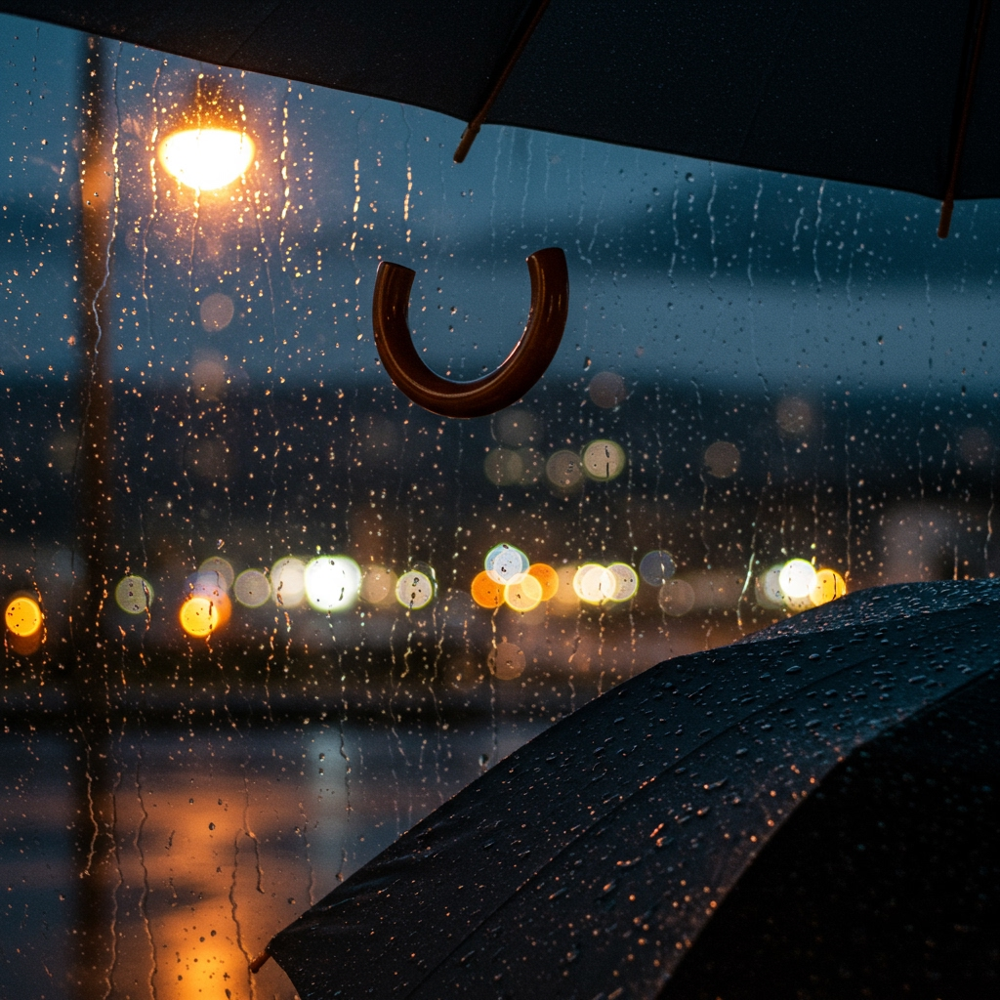

In [ ]:
# Generate Image
img_response = client.models.generate_images(
    model='imagen-3.0-generate-002',
    prompt='An umbrella in the foreground, and a rainy night sky in the background',
    config=types.GenerateImagesConfig(
        negative_prompt='human',
        number_of_images=1,
        include_rai_reason=True,
        output_mime_type='image/jpeg',
    ),
)
img_response.generated_images[0].image.show()

### Image Prompt Enhancement

This example uses Gemini to enhance an image generation prompt, then send that prompt to Imagen 3.

Original Prompt: An umbrella in the foreground, and a rainy night sky in the background
Enhanced Prompt: Beneath a bruised velvet sky bleeding with neon streaks, a lone, crimson pagoda umbrella, intricately carved with weeping koi scales, tilts precariously in the foreground. Rain, not of water, but of glittering, iridescent dust, cascades from the heavens, illuminating a spectral cityscape shrouded in fog. The umbrella’s silken canopy, subtly transparent, reveals fleeting glimpses of bioluminescent flora blooming on distant, rain-slicked rooftops, and ghostly figures navigating the dreamlike downpour with paper lanterns that cast elongated, phantasmic shadows. The overall scene evokes a sense of melancholic beauty and ethereal mystery, a merging of ancient tradition and cyberpunk futurism, captured in a single, suspended moment.



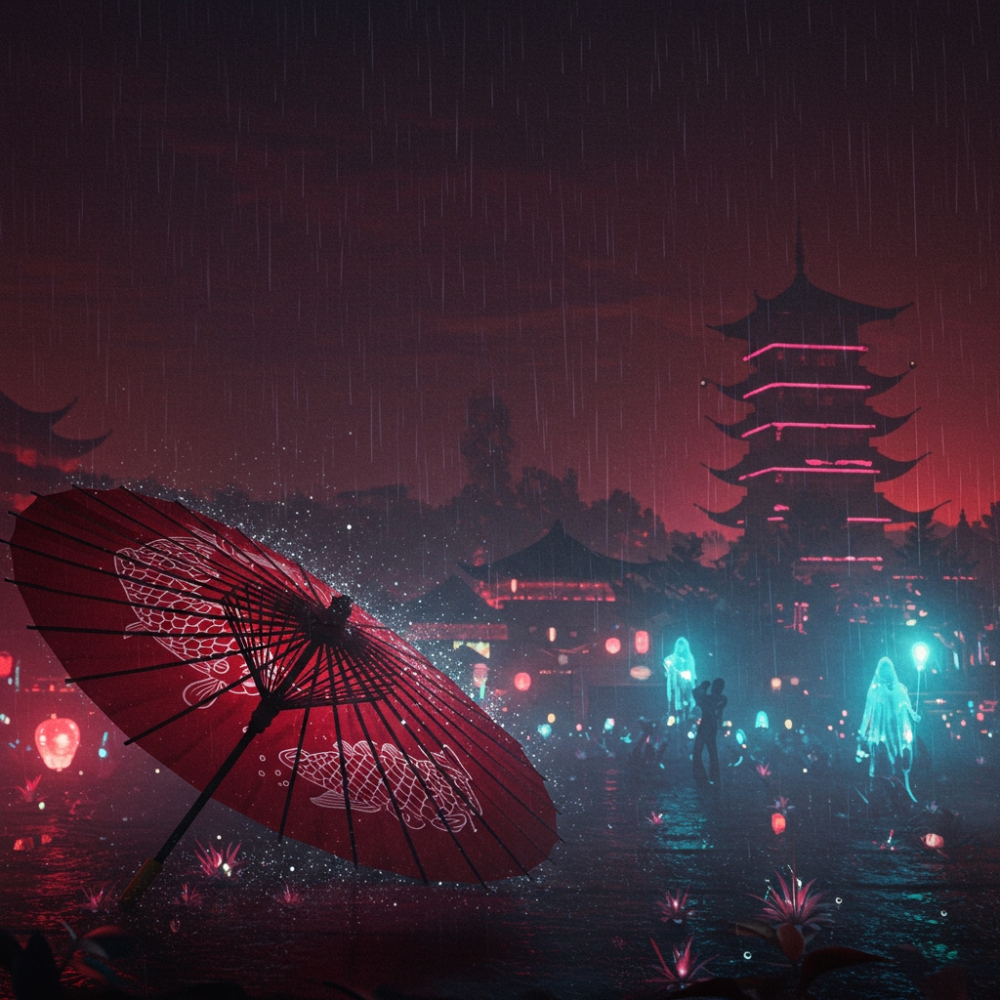

In [ ]:
from google import genai
from google.genai import types
from google.genai.types import ToolConfig, FunctionCallingConfig, GenerateContentConfig, FunctionCallingConfigMode
from IPython.display import Markdown

# Ask Gemini to enhance a prompt
image_prompt = "An umbrella in the foreground, and a rainy night sky in the background"

response = client.models.generate_content(
    model="gemini-2.0-flash-001",
    contents="Enhance this image prompt, be very creative, provide only a single enhanced prompt: " + image_prompt,
)

enhanced_prompt = response.text

# Output the original and enhanced prompts
print(f"Original Prompt: {image_prompt}")
print(f"Enhanced Prompt: {enhanced_prompt}")


# Use the enhanced prompt to generate the image
img_response = client.models.generate_images(
    model='imagen-3.0-generate-002',
    prompt=enhanced_prompt,
    config=types.GenerateImagesConfig(
        negative_prompt='human',
        number_of_images=1,
        include_rai_reason=True,
        output_mime_type='image/jpeg',
    ),
)
img_response.generated_images[0].image.show()

## Multimodal Structured Prompts

For the first time, we are going to use a list to contain the different parts of the prompt. This can be done in a variety of ways,

Provide a single string as shown in the text example above:

```python
contents='Can you recommend some things to do in Boston and New York in the winter?'
```
Provide a single Content instance with multiple Part instances:
```python
contents=types.Content(parts=[
    types.Part.from_text(text='Can you recommend some things to do in Boston in the winter?'),
    types.Part.from_text(text='Can you recommend some things to do in New York in the winter?')
], role='user')
```

When sending more than one input type, provide a list with multiple Content instances:
```python
contents=[
    'What is this a picture of?',
    types.Part.from_uri(
        file_uri='gs://generativeai-downloads/images/scones.jpg',
        mime_type='image/jpeg',
    ),
]
```

Learn more at:
*   **How to structure contents:** https://googleapis.github.io/python-genai/#how-to-structure-contents
*   **genai.types.Part:** https://googleapis.github.io/python-genai/genai.html#genai.types.Part


In [ ]:
# Here, we use Part.from_bytes() to send the image that was generated in the previous cell.
# Note that we need to provide both the image bytes and the mime_type.
prompt = [
        types.Part.from_bytes(
            data=img_response.generated_images[0].image.image_bytes,
            mime_type=img_response.generated_images[0].image.mime_type
            ),
        "Describe the above image"
        ]

# Send the request
response = client.models.generate_content(
    model="gemini-2.0-flash-001",
    contents=prompt
)

Markdown(response.text)

Here's a description of the image:

**Overall Impression:**

The image depicts a surreal, atmospheric scene reminiscent of a Japanese-inspired fantasy world in the rain. It combines traditional Japanese elements with a modern, neon-lit aesthetic and a touch of the supernatural.

**Setting:**

*   **Environment:** It is raining heavily. The scene seems to take place in a flooded area, perhaps a garden or a park.
*   **Background:** A traditional Japanese pagoda with neon pink highlights dominates the background. Other buildings with traditional architecture and glowing lanterns add to the setting.

**Foreground:**

*   **Umbrella:** A large, red, traditional Japanese umbrella lies partially submerged in the water. It's decorated with white fish patterns.
*   **Flora:** Glowing plants emerge from the water.

**Figures:**

*   Ghostly figures are seen in the middle ground. One appears to be a couple embracing, while others carry glowing lights.

**Color and Lighting:**

*   The overall color palette is dominated by reds, pinks, and blues.
*   Neon lights and glowing elements give the scene a distinctly cyberpunk-esque feel.

**Atmosphere:**

*   The rain, combined with the neon lights and ghostly figures, creates a dreamlike and slightly melancholic atmosphere. The image blends the familiar with the fantastical to create a visually striking and intriguing scene.

## Simple Example: Using Python Requests Library

In [ ]:
import requests

html_url="https://arxiv.org/html/1706.03762v7"

# Get the contents of the HTML URL using the Python Requests library
content = requests.get(html_url).content

# Create a multi-part prompt
prompt = [
    content,
    "Summarize the above content"
]

# Generate our response
response = client.models.generate_content(
    model=MODEL_ID,
    contents=prompt
)

Markdown(response.text)

This document is the "Attention Is All You Need" research paper, which introduces the Transformer model, a novel neural network architecture based solely on attention mechanisms. The paper challenges the dominance of recurrent and convolutional neural networks in sequence transduction tasks like machine translation.

Here's a breakdown of the key elements:

*   **Introduction:** The paper proposes the Transformer as an alternative to recurrent models (LSTMs, GRUs) for sequence modeling, highlighting the limitations of sequential computation in recurrent networks and the benefits of attention mechanisms.

*   **Background:** Discusses previous work aimed at reducing sequential computation, such as Neural GPUs, ByteNet, and ConvS2S. It positions the Transformer as the first transduction model relying entirely on self-attention without sequence-aligned RNNs or convolutions.

*   **Model Architecture:**
    *   The Transformer uses an encoder-decoder structure with stacked self-attention and fully connected layers.
    *   Both encoder and decoder consist of N=6 identical layers.
    *   Key components include multi-head attention, scaled dot-product attention, residual connections, and layer normalization.
    *   The decoder uses masking to prevent attending to future positions, ensuring auto-regressive generation.
    *   Positional encoding is used to provide information about the order of tokens.

*   **Why Self-Attention:**  It compares self-attention layers to recurrent and convolutional layers, focusing on computational complexity, parallelization, and path length for long-range dependencies, arguing self-attention provides advantages.

*   **Training:**
    *   Describes the training data (WMT 2014 English-German and English-French datasets), batching strategy, hardware (NVIDIA P100 GPUs), optimizer (Adam), and regularization techniques (residual dropout and label smoothing).
    *   It includes a learning rate schedule.

*   **Results:**
    *   Presents results on machine translation tasks, demonstrating that the Transformer achieves state-of-the-art BLEU scores with significantly less training time and cost.
    *   Includes experiments analyzing the effects of varying architectural parameters.
    *   Shows that the Transformer generalizes well to English constituency parsing, even with limited training data.

*   **Conclusion:** Emphasizes the potential of attention-based models and outlines future research directions, such as extending the model to other modalities and improving generation efficiency.

*   **Appendix (Attention Visualizations):** Shows examples of how the attention mechanism learns dependencies between words in sentences and relate to syntactic and semantic structures.

Essentially, the Transformer's architecture enables more parallelization and reduces the need for sequential computation, leading to faster training times and improved results on various sequence transduction tasks.


### Multimodal Prompting: PDF Example
Let's practice sending a PDF and summarizing it.

In [ ]:
pdf_url = "https://arxiv.org/pdf/1706.03762"

# Get the contents of the PDF URL using the Python Requests library
content = requests.get(pdf_url).content

pdf_part = types.Part.from_bytes(
      data=content,
      mime_type="application/pdf" # <=== Set the MIME TYPE to 'application/pdf'
    )
# Create a multi-part prompt
prompt = [
    pdf_part,
    "Summarize the above content"
]

response = client.models.generate_content(
    model=MODEL_ID,
    contents=prompt
)

Markdown(response.text)

Here is a summary of the document:

This paper introduces the "Transformer," a novel neural network architecture for sequence transduction, such as machine translation and language modeling. Unlike traditional models relying on recurrent or convolutional layers, the Transformer utilizes only attention mechanisms, allowing for greater parallelization and reduced training time.

Key aspects of the Transformer:

*   **Attention-Based:** The Transformer is built entirely on attention mechanisms, dispensing with recurrence and convolutions.
*   **Encoder-Decoder Structure:** The model has an encoder to map input to continuous representations and a decoder to generate the output sequence, with attention connecting them.
*   **Multi-Head Attention:** Multiple attention heads are used to jointly attend to information from different representation subspaces.
*   **Positional Encoding:** Since attention is order-agnostic, positional encodings are added to input embeddings to inform the model about the position of tokens.

The paper presents experiments on machine translation tasks, demonstrating:

*   Superior performance in English-to-German and English-to-French translation compared to previous state-of-the-art models (including ensembles).
*   Significant reduction in training time.
*   Generalization to other tasks, such as English constituency parsing.

The paper also includes visualizations of the attention mechanisms, showing that attention heads learn to perform different tasks related to the syntactic and semantic structure of sentences.

In conclusion, the Transformer is a promising architecture for sequence transduction, offering improved performance, faster training, and potentially better interpretability compared to traditional recurrent and convolutional models.

---
---

## Using Playwright to Screenshot Pages

This example uses [Playwright](https://playwright.dev/) to visit a page and take a full-page screenshot which is then sent to Gemini for summarization.

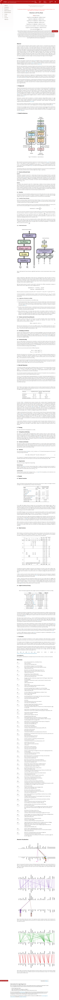

In [ ]:
# Use playwright to visit a URL and take a screenshot of the entire page which is saved to a local file.

from playwright.async_api import async_playwright
from playwright.sync_api import sync_playwright
import playwright
import asyncio
from IPython.display import Image

# Colab runs in an async runloop, so we'll write this as an async function
async def fetch_page_image(url: str = ""):
    async with async_playwright() as p:
        # Generate a filename using the url, but use only the domain and path, delimited by an underscore (_)
        filename = url.replace("https://", "").replace("http://", "").replace("/", "_") + ".png"
        browser = await p.chromium.launch()
        page = await browser.new_page()
        await page.goto(url)
        await page.screenshot(path=f"{filename}", full_page=True)
        # Get the HTML content
        html_content = await page.content()
        await browser.close()
        # Return the image bytes and HTML content
        return filename, open(f"{filename}", "rb").read(), html_content


image_filename, image_bytes, html_content = await fetch_page_image("https://arxiv.org/html/1706.03762v7")

# Display the image in path "example.png" but scaled to 100 pixels wide
Image(filename=image_filename, width=800)

In [ ]:
# Upload the file using the API

from pydantic import BaseModel, Field
from google.cloud import storage
from google import genai
from google.genai import types
import pprint

class ArxivExtractionModel(BaseModel):
  page_summary: str = Field(description="A summary of the provided webpage")
  authors: list[str] = Field(description="The name(s) of the authors.")
  references: list[str] = Field(description="Every reference cited in the paper")

# If using GCP (PROJECT_ID is defined), create a "Part" from the image bytes we already have in memory,
# otherwise (PROJECT_ID is empty), we're using AI Studio, so upload the file using the
if PROJECT_ID != "":

  if BUCKET == "":
    # Create image part from existing bytes stored in memory
    image_part = types.Part.from_bytes(data=image_bytes, mime_type="image/png")
  else:
    # Alternative: Upload the file to GCS and use a Part.from_uri
    storage_client = storage.Client(project=PROJECT_ID)
    bucket = storage_client.bucket(BUCKET)
    blob = bucket.blob(image_filename)
    blob.upload_from_filename(image_filename)

    gcs_uri = f'gs://{bucket.name}/{blob.name}'

    image_part = types.Part.from_uri(
      file_uri=gcs_uri,
      mime_type="image/png"
    )

else:
  file_upload = client.files.upload(path=image_filename)
  image_part=types.Part.from_uri(
                    file_uri=file_upload.uri,
                    mime_type=file_upload.mime_type)

# Use a multi-part structured prompt
prompt = ["# Web Page Image",
          image_part,
          "# Web Page HTML Content",
          html_content,
          "Summarize the web page screenshot and HTML content. Then condense the information contained within. format everyting in Markdown."
          ]

config = types.GenerateContentConfig(
    response_schema=ArxivExtractionModel,
    response_mime_type="application/json",
    system_instruction=None
)

response = client.models.generate_content(
    model=MODEL_ID,
    contents=prompt,
    config=config,
)

# Parse the structured response. This can be done using `response.parsed` (Method 1)
# or through explicit casting/model validation (Method 2)

# Method 1: Use "response.parsed" to get the response cast into ArxivExtractionModel
parsed_response = response.parsed

# Method 2: Use explicit casting (not used, but equivalent to Method 1)
cast_response = ArxivExtractionModel.model_validate_json(response.text)

# Print the results
print(parsed_response.model_dump_json(indent=2))
print("---")
Markdown(parsed_response.page_summary)

{
  "page_summary": "This webpage is the HTML version of the research paper titled \"Attention Is All You Need\", introducing the Transformer model architecture. The paper argues for replacing recurrent and convolutional layers with self-attention mechanisms for sequence transduction tasks like machine translation. The Transformer allows for more parallelization and achieves state-of-the-art translation quality with significantly less training time. The page includes the paper's abstract, introduction, background, a detailed explanation of the model architecture (encoder and decoder stacks, attention mechanisms, position-wise feed-forward networks, embeddings, and positional encoding), a discussion on why self-attention is beneficial, training details, and results on machine translation and English constituency parsing. Visualizations of attention mechanisms and links to related resources, such as the source code, are also provided. Finally, there are prompts for users to report any is

This webpage is the HTML version of the research paper titled "Attention Is All You Need", introducing the Transformer model architecture. The paper argues for replacing recurrent and convolutional layers with self-attention mechanisms for sequence transduction tasks like machine translation. The Transformer allows for more parallelization and achieves state-of-the-art translation quality with significantly less training time. The page includes the paper's abstract, introduction, background, a detailed explanation of the model architecture (encoder and decoder stacks, attention mechanisms, position-wise feed-forward networks, embeddings, and positional encoding), a discussion on why self-attention is beneficial, training details, and results on machine translation and English constituency parsing. Visualizations of attention mechanisms and links to related resources, such as the source code, are also provided. Finally, there are prompts for users to report any issues.

# 9.0 - Developing Agents

## Workflow-style Agent: Using Google Search Retrieval Tool to Appraise Trading Cards

This example uses function calling, Google search, structured output, and procedural code to demonstratea semi-agentic workflow that appraises the value of a collectible trading card by:
1. Downloading a photo of the card
2. Extracting text from the card
3. Using the text to execute a Google Search and appraise the value
4. Use the appraisal and extracted data to generate final output

In [ ]:
from typing import Optional
from pydantic import BaseModel, Field


class PriceEstimate(BaseModel):
    market_price: Optional[float] = None
    low_price: Optional[float] = None
    high_price: Optional[float] = None
    average_price: Optional[float] = None
    last_sold_price: Optional[float] = None
    currency: str = "USD"


class Card(BaseModel):
    title: str = Field(description="Card Title")
    image_url: str = Field(description="Card Image URL as provided in the prompt")
    ocr_text: str = Field(description="Card OCR Text")
    card_set: str = Field(description="Card Set")
    game_category: str = Field(description="Card Game Category (e.g., Pokémon, Magic: The Gathering, Yu-Gi-Oh!, Topps, etc.)")
    grader_authority: str = Field(description="Card grader authority (e.g. BGS, PSA, SGC, etc.)")
    grade: str = Field(description="Card grade")
    variant: str = Field(description="Card variant (e.g. Holo, Shadowless, Ultra rare, Autograph)")
    language: str = Field(description="Card language (e.g. English, Japanese)")
    serial_number: str = Field(description="Card serial number")
    number: str = Field(description="Card number")
    price_estimate: PriceEstimate = Field(description="Card price estimate")


class AppraisalResponses(BaseModel):
    extracted_card_response: types.GenerateContentResponse
    appraisal_response: types.GenerateContentResponse
    estimated_price_response: types.GenerateContentResponse

class Evaluation(BaseModel):
  #image: bytes
  evaluation: Card
  responses: AppraisalResponses


In [ ]:
extraction_system_instruction = """
You are tasked with extracting information from collectible trading cards.

You will be provided with an image and a JSON schema.

Examples of fields and their possible values include:

card game (e.g., Pokémon, Magic: The Gathering, Yu-Gi-Oh!, Topps),
set name,
card title,
grader (e.g. BGS, PSA, SGC, etc.),
card grade,
variant: (e.g. Holo, Shadowless, Ultra rare, Autograph),
language: (e.g. English, Japanese),
Serial Number,
Card Number
"""

appraisal_system_instruction = """
You are tasked with evaluating information from collectible trading cards
and estimating their current market value.

You will be provided with a JSON document containing the extracted data from a card image.

Use the data to compose Google search queries to estimate the current market value of the card.

Use the Google Search Tool to search for details about these trading cards
to estimate its current market value as accurately as possible.
Base your valuation on the most recent verifiable sales and market trends.

Consider the following factors:
card game (e.g., Pokémon, Magic: The Gathering, Yu-Gi-Oh!, Topps),
set name, card title, grader (e.g. BGS, PSA, SGC, etc.), card grade,
variant: (e.g. Holo, Shadowless, Ultra rare, Autograph),
language: (e.g. English, Japanese), Serial Number, Card Number,
recent sales data (e.g., eBay, TCGPlayer, Heritage Auctions),
demand trends, and historical price fluctuations.

If the card has notable errors, misprints, or special variations,
adjust the estimate accordingly.

Provide a detailed appraisal based on your searches and conclude your appraisal with the following data points:
   * market_price: The current market price of the card.
   * low_price: The lowest price you found
   * high_price: The highest price you found
   * average_price: The average price you found
   * last_sold_price: The price of the last sold card
   * currency: The currency of the price (e.g. USD)
"""

price_estimate_system_instruction = """
Use the provided trading card appraisal and extract the values for the following fields:
   * market_price: The current market price of the card.
   * low_price: The lowest price you found
   * high_price: The highest price you found
   * average_price: The average price you found
   * last_sold_price: The price of the last sold card
   * currency: The currency of the price (e.g. USD)
"""

In [ ]:
from PIL import Image
from IPython.display import Image as ShowImage
import requests
import io
from google.genai import types

def get_card_image(card_url) -> bytes:
  """Gets the card image from the URL and converts it to JPEG.

  Args:
    card_url: The URL of the card image.

  Returns:
    The card image as a JPEG byte string.
  """
  response = requests.get(card_url, stream=True, allow_redirects=True)
  response.raise_for_status()  # Raise an exception for bad responses (4xx or 5xx)
  image = Image.open(io.BytesIO(response.content))

  # Convert the image to RGB mode if it's not already
  if image.mode != 'RGB':
    image = image.convert('RGB')

  # Save the image to a byte buffer in JPEG format
  with io.BytesIO() as output:
    image.save(output, format="JPEG")
    jpeg_data = output.getvalue()

  return jpeg_data


def extract_card_data(image: bytes, image_url) -> types.GenerateContentResponse:
  image_part = types.Part.from_bytes(
        data=image,
        mime_type="image/jpeg"
      )
  # Create a multi-part prompt
  prompt = [
      image_part,
      f"Extract the above content per the system instructions. The image URL is: {image_url}"
  ]

  response = client.models.generate_content(
      model=MODEL_ID,
      contents=prompt,
      config=types.GenerateContentConfig(
          system_instruction=extraction_system_instruction,
          response_mime_type='application/json',
          response_schema=Card,
      ),
  )

  return response

def appraise_card(card: Card) -> types.GenerateContentResponse:
    response = client.models.generate_content(
      model=MODEL_ID,
      contents=card.model_dump_json(indent=2),
      config=types.GenerateContentConfig(
          system_instruction=appraisal_system_instruction,
          tools=[types.Tool(
            google_search=types.GoogleSearchRetrieval
        )]
      )
    )

    return response

def get_price_estimate(appraisal: str) -> PriceEstimate:
    response = client.models.generate_content(
    model=MODEL_ID,
    contents=appraisal,
    config=types.GenerateContentConfig(
        system_instruction=price_estimate_system_instruction,
        response_mime_type='application/json',
        response_schema=PriceEstimate,
      ),
    )

    return response



def evaluate_card(image: bytes, image_url) -> tuple[Card, AppraisalResponses]:
    extracted_card = extract_card_data(image, image_url)

    card = extracted_card.parsed
    appraisal = appraise_card(card)
    estimated_price = get_price_estimate(appraisal.text)
    card.price_estimate = estimated_price.parsed

    responses = AppraisalResponses(extracted_card_response=extracted_card,
                                   appraisal_response=appraisal,
                                   estimated_price_response=estimated_price)
    return card, responses




{
  "title": "Alakazam",
  "image_url": "https://i.ebayimg.com/images/g/-64AAOSwBKhnEIQm/s-l1600.webp",
  "ocr_text": "B\nBECKETTⓇ\n1999 BASE 1ST EDITION\nTHIN STAMP\n#1 ALAKAZAM HOLO R\n9\nCENTERING 9\nEDGES 9\nCORNERS 9\nSURFACE 8.5\nMINT\n0014919949\nSTAGE 2\nDIZIO Evolves from Kadabra\nPut Alakazam on the Stage I card\nAlakazam\n80 HP\nPsi Pokémon. Length: 4' 11\", Weight: 106 lbs.\nPokémon Power: Damage Swap As often as you\nlike during your turn (before your attack), you may move\nI damage counter from I of your Pokémon to another\nas long as you don't Knock Out that Pokémon. This power\ncan't be used if Alakazam is Asleep, Confused, or Paralyzed.\nConfuse Ray Flip a coin If heads, the Defending 30\nConfused.\nweakness resistance retreat cost\nIts brain can outperform a supercomputer. Its intelligence\nquotient is said to be 5000. LV. 42 #65\nIllus. Ken Sugimori © 1995, 96, 98, 99 Nintendo, Creatures, GAMEFREAK. © 1999 Wizards. 1/102 ★\nPAT.6295750BP",
  "card_set": "Base 1st Edi

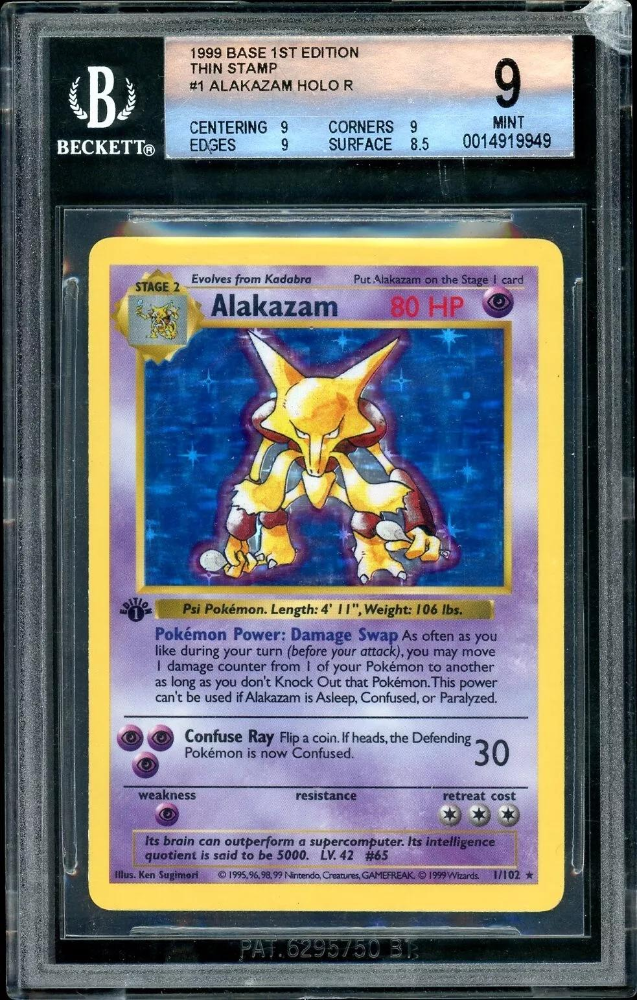

In [ ]:
card_image_url = "https://i.ebayimg.com/images/g/-64AAOSwBKhnEIQm/s-l1600.webp"
image = get_card_image(card_image_url)

extracted_card = extract_card_data(image, card_image_url)
card = extracted_card.parsed
appraisal = appraise_card(card)
estimate = get_price_estimate(appraisal.text)
card.price_estimate = estimate.parsed

print(extracted_card.parsed.model_dump_json(indent=2))
print("======")
print(appraisal.text)
print("======")
print(estimate.parsed.model_dump_json(indent=2))
print("======")
print(card.model_dump_json(indent=2))
ShowImage(image, width=600)

## CrewAI Agent
This sample CrewAI agent first generates a list of planets, then randomly selects one before sharing 3 facts about the selected planet.

In [ ]:
from typing import Type, List, Optional
from pydantic import BaseModel, Field
from crewai import LLM, Task, Agent, Crew
from crewai.tools import BaseTool
import random
from IPython.display import display, Markdown


class SolarSystem(BaseModel):
    planets: List[str] = Field(..., description="A python list containing planet names")

class PlanetSelectorTool(BaseTool):
  name: str = "random_planet_selector"
  description: str = "Select a random planet from an SolarSystem instance"
  args_schema: Type[BaseModel] = SolarSystem

  def _run(self, planets: List[str] ) -> str:
    planet = random.choice(planets)
    display(Markdown(f"Selected planet: {planet}"))
    return planet

tool_planet_selector = PlanetSelectorTool()

llm = LLM(
    model="vertex_ai/gemini-2.0-flash-001",
)

# Create an agent using the custom LLM
agent = Agent(
    role="AI Assistant",
    goal="Provide helpful responses",
    backstory="I am an AI assistant created to help users.",
    llm=llm,
    verbose=True
)

task_planet_list=Task(
    description="List all planets in the solar system",
    expected_output="A list of planets",
    output_pydantic=SolarSystem,
    agent=agent
)

task_planet_selector=Task(
    description="Select a random planet from this list:",
    expected_output="The name of the selected planet",
    agent=agent,
    tools=[tool_planet_selector],
    context=[task_planet_list]
)

# Create tasks for the agent
task_facts = Task(
    description="Provide 3 facts about the following planet",
    expected_output="Respond to user queries",
    agent=agent,
    context=[task_planet_selector]
)

# Create the crew with the agent and task
crew = Crew(
    agents=[agent],
    tasks=[task_planet_list, task_planet_selector, task_facts],
)

response = crew.kickoff()

Markdown(response.raw)

# Agent: AI Assistant
## Task: List all planets in the solar system


# Agent: AI Assistant
## Final Answer: 
```json
{
  "planets": [
    "Mercury",
    "Venus",
    "Earth",
    "Mars",
    "Jupiter",
    "Saturn",
    "Uranus",
    "Neptune"
  ]
}
```


# Agent: AI Assistant
## Task: Select a random planet from this list:


Selected planet: Mercury



# Agent: AI Assistant
## Thought: I need to select a random planet from the list provided in the context. I can use the `random_planet_selector` tool for this.
## Using tool: random_planet_selector
## Tool Input: 
"{\"planets\": [\"Mercury\", \"Venus\", \"Earth\", \"Mars\", \"Jupiter\", \"Saturn\", \"Uranus\", \"Neptune\"]}"
## Tool Output: 
Mercury


# Agent: AI Assistant
## Final Answer: 
Mercury


# Agent: AI Assistant
## Task: Provide 3 facts about the following planet


# Agent: AI Assistant
## Final Answer: 
Here are 3 facts about Mercury:

1.  Mercury is the smallest planet in our solar system and closest to the Sun. Its diameter is about 4,880 kilometers (3,032 miles), which is about 38% of Earth's diameter.

2.  Mercury has a heavily cratered surface, much like the Moon, due to numerous impacts from asteroids and comets. It has no significant atmosphere to burn up incoming objects, so the surface preserves a long history of these impacts.

3.  Mercury has an extremely thin a

Here are 3 facts about Mercury:

1.  Mercury is the smallest planet in our solar system and closest to the Sun. Its diameter is about 4,880 kilometers (3,032 miles), which is about 38% of Earth's diameter.

2.  Mercury has a heavily cratered surface, much like the Moon, due to numerous impacts from asteroids and comets. It has no significant atmosphere to burn up incoming objects, so the surface preserves a long history of these impacts.

3.  Mercury has an extremely thin atmosphere (exosphere) and experiences the greatest temperature range of any planet in our solar system. Temperatures can range from 430°C (800°F) during the day to -180°C (-290°F) at night.

## Introducing Google Agent Development Kit

In [ ]:
from typing import Any, Dict, List, Optional

class MyAgent:
  """Agent to be deployed on Agent Engine."""

  def __init__(self, model, name, instruction, tools, flow, project, app_name = ""):
    self.model = model
    self.name = name
    self.instruction = instruction
    self.tools = tools
    self.flow = flow
    self.app_name = app_name
    self.project = project
    self.runner = None
    self.session_service = None

  def clone(self):
    return MyAgent(
      model=self.model,
      name=self.name,
      instruction=self.instruction,
      tools=self.tools,
      flow=self.flow,
      project=self.project,
      app_name=self.app_name,
    )

  def set_up(self):
    import os
    from agents.sessions.in_memory_session_service import InMemorySessionService
    from agents.artifacts.in_memory_artifact_service import InMemoryArtifactService
    from agents import Runner, Agent

    os.environ["GOOGLE_GENAI_USE_VERTEXAI"] = "1"
    os.environ["GOOGLE_CLOUD_PROJECT"] = self.project
    os.environ["GOOGLE_CLOUD_LOCATION"] = "us-central1"

    self.agent = Agent(
        model=self.model,
        name=self.name,
        instruction=self.instruction,
        tools=self.tools,
        flow=self.flow,
    )
    self.artifact_service = InMemoryArtifactService()
    self.session_service = InMemorySessionService()
    self.runner = Runner(
        app_name=self.app_name,
        agent=self.agent,
        artifact_service=self.artifact_service,
        session_service=self.session_service,
    )

  def get_session(self, session_id: str, user_id: str = "user_id"):
    session = self.session_service.get_session(self.app_name, user_id, session_id)
    if not session:
      raise Exception("Session not found. Please create it using .create_session()")
    return session

  def list_sessions(self, user_id: str = "user_id"):
    return self.session_service.list_sessions(self.app_name, user_id)

  def create_session(
      self,
      *,
      session_id: str = None,
      user_id: str = "user_id",
      state: Optional[Dict[str, Any]] = None
  ):
    if not self.session_service:
      self.set_up()
    return self.session_service.create_session(
        self.app_name, user_id, state, session_id=session_id
    )

  def delete_session(self, session_id: str, user_id: str = "user_id"):
    self.session_service.delete_session(self.app_name, user_id, session_id)

  def run(self, session_id: str, message: str, user_id: str = "user_id"):
    from google.genai import types
    content = types.Content(role='user', parts=[types.Part(text=message)])
    session = self.get_session(session_id, user_id)
    if not self.runner:
      self.set_up()
    for event in self.runner.run(session=session, new_message=content):
      if event.content:
        yield event.content.model_dump(exclude_none=True)

  def register_operations(self) -> Dict[str, List[str]]:
    return {
        "": [
            "get_session",
            "list_sessions",
            "create_session",
            "delete_session",
        ],
        "stream": ["run"],
    }

In [ ]:
def roll_die(sides: int) -> int:
  """Roll a die and return the rolled result.

  Args:
    sides: The integer number of sides the die has.

  Returns:
    An integer of the result of rolling the die.
  """
  import random

  return random.randint(1, sides)

def check_prime(nums: list[int]) -> list[str]:
  """Check if a given list of numbers are prime.

  Args:
    nums: The list of numbers to check.

  Returns:
    A str indicating which number is prime.
  """

  primes = set()
  for number in nums:
    number = int(number)
    if number <= 1:
      continue
    is_prime = True
    for i in range(2, int(number**0.5) + 1):
      if number % i == 0:
        is_prime = False
        break
    if is_prime:
      primes.add(number)
  return (
      'No prime numbers found.'
      if not primes
      else f"{', '.join(str(num) for num in primes)} are prime numbers."
  )

In [ ]:
import os
import asyncio
from google.adk.agents import Agent
#from google.adk.models.lite_llm import LiteLlm # For multi-model support
from google.adk.sessions import InMemorySessionService, VertexAiSessionService
from google.adk.runners import Runner
from google.genai import types # For creating message Content/Parts

import warnings
# Ignore all warnings
warnings.filterwarnings("ignore")

import logging
logging.basicConfig(level=logging.ERROR)

print("Libraries imported.")

MODEL = "gemini-2.5-flash-preview-04-17" #@param {type:"string"}
STAGING_BUCKET = "adk-staging-250423a" #@param {type:"string"}

APP_NAME = 'TEST_APP'
USER_ID = 'TEST_USER'

os.environ["GOOGLE_CLOUD_PROJECT"] = PROJECT_ID
os.environ["GOOGLE_GENAI_USE_VERTEXAI"] = "1"
os.environ["GOOGLE_CLOUD_LOCATION"] = LOCATION

my_agent = Agent(
    model=MODEL,
    name='data_processing_agent',
    instruction="""
      You roll dice and answer questions about the outcome of the dice rolls.
      You can roll dice of different sizes.
      You can use multiple tools in parallel by calling functions in parallel(in one request and in one round).
      The only things you do are roll dice for the user and discuss the outcomes.
      It is ok to discuss previous dice roles, and comment on the dice rolls.
      When you are asked to roll a die, you must call the roll_die tool with the number of sides. Be sure to pass in an integer. Do not pass in a string.
      You should never roll a die on your own.
      When checking prime numbers, call the check_prime tool with a list of integers. Be sure to pass in a list of integers. You should never pass in a string.
      You should not check prime numbers before calling the tool.
      When you are asked to roll a die and check prime numbers, you should always make the following two function calls:
      1. You should first call the roll_die tool to get a roll. Wait for the function response before calling the check_prime tool.
      2. After you get the function response from roll_die tool, you should call the check_prime tool with the roll_die result.
        2.1 If user asks you to check primes based on previous rolls, make sure you include the previous rolls in the list.
      3. When you respond, you must include the roll_die result from step 1.
      You should always perform the previous 3 steps when asking for a roll and checking prime numbers.
      You should not rely on the previous history on prime results.
    """,
    tools=[roll_die, check_prime],
)

print(f"Agent '{my_agent.name}' created using model '{MODEL}'.")

Libraries imported.
Agent 'data_processing_agent' created using model 'gemini-2.5-flash-preview-04-17'.


In [ ]:
import warnings

warnings.filterwarnings('ignore', category=UserWarning)

# @title Setup Session Service and Runner

# --- Session Management ---
# Key Concept: SessionService stores conversation history & state.
# InMemorySessionService is simple, non-persistent storage for this tutorial.
session_service = InMemorySessionService()

# Define constants for identifying the interaction context
APP_NAME = "tutorial_app"
USER_ID = "user_1"
SESSION_ID = "session_001" # Using a fixed ID for simplicity

# Create the specific session where the conversation will happen
session = session_service.create_session(
    app_name=APP_NAME,
    user_id=USER_ID,
    session_id=SESSION_ID
)
print(f"Session created: App='{APP_NAME}', User='{USER_ID}', Session='{SESSION_ID}'")

# --- Runner ---
# Key Concept: Runner orchestrates the agent execution loop.
runner = Runner(
    agent=my_agent, # The agent we want to run
    app_name=APP_NAME,   # Associates runs with our app
    session_service=session_service # Uses our session manager
)
print(f"Runner created for agent '{runner.agent.name}'.")

Session created: App='tutorial_app', User='user_1', Session='session_001'
Runner created for agent 'data_processing_agent'.


In [ ]:
# @title List All Sessions
session_service.list_sessions(app_name=APP_NAME, user_id=USER_ID)

ListSessionsResponse(sessions=[Session(id='session_001', app_name='tutorial_app', user_id='user_1', state={}, events=[], last_update_time=1745438566.762381)])

In [ ]:
# @title Get a Specific Session by ID
session_service.get_session(app_name=APP_NAME, user_id=USER_ID, session_id=SESSION_ID)

Session(id='session_001', app_name='tutorial_app', user_id='user_1', state={}, events=[], last_update_time=1745438566.762381)

In [ ]:
# @title Define Agent Interaction Function
import asyncio
from google.genai import types # For creating message Content/Parts

async def call_agent_async(query: str):
  """Sends a query to the agent and prints the final response."""
  print(f"\n>>> User Query: {query}")

  # Prepare the user's message in ADK format
  content = types.Content(role='user', parts=[types.Part(text=query)])

  final_response_text = "Agent did not produce a final response." # Default

  # Key Concept: run_async executes the agent logic and yields Events.
  # We iterate through events to find the final answer.
  async for event in runner.run_async(user_id=USER_ID, session_id=SESSION_ID, new_message=content):
      # You can uncomment the line below to see *all* events during execution
      # print(f"  [Event] Author: {event.author}, Type: {type(event).__name__}, Final: {event.is_final_response()}, Content: {event.content}")

      # Key Concept: is_final_response() marks the concluding message for the turn.
      if event.is_final_response():
          if event.content and event.content.parts:
             # Assuming text response in the first part
             final_response_text = event.content.parts[0].text
          elif event.actions and event.actions.escalate: # Handle potential errors/escalations
             final_response_text = f"Agent escalated: {event.error_message or 'No specific message.'}"
          # Add more checks here if needed (e.g., specific error codes)
          break # Stop processing events once the final response is found

  print(f"<<< Agent Response: {final_response_text}")


def call_agent(query: str):
  """Sends a query to the agent and prints the final response."""
  print(f"\n>>> User Query: {query}")

  # Prepare the user's message in ADK format
  content = types.Content(role='user', parts=[types.Part(text=query)])

  final_response_text = "Agent did not produce a final response." # Default

  # Key Concept: run_async executes the agent logic and yields Events.
  # We iterate through events to find the final answer.
  for event in runner.run(user_id=USER_ID, session_id=SESSION_ID, new_message=content):
      # You can uncomment the line below to see *all* events during execution
      # print(f"  [Event] Author: {event.author}, Type: {type(event).__name__}, Final: {event.is_final_response()}, Content: {event.content}")

      # Key Concept: is_final_response() marks the concluding message for the turn.
      if event.is_final_response():
          if event.content and event.content.parts:
             # Assuming text response in the first part
             final_response_text = event.content.parts[0].text
          elif event.actions and event.actions.escalate: # Handle potential errors/escalations
             final_response_text = f"Agent escalated: {event.error_message or 'No specific message.'}"
          # Add more checks here if needed (e.g., specific error codes)
          break # Stop processing events once the final response is found

  print(f"<<< Agent Response: {final_response_text}")

In [ ]:
call_agent("Roll a d20")


>>> User Query: Roll a d20


<<< Agent Response: You rolled a 17.


In [ ]:
# @title Run the Initial Conversation

def run_conversation():
    call_agent("Roll a d20")
    call_agent("What's the weather like?") # Expecting the tool's error message
    call_agent("Roll a d100")

# Execute the conversation using await in an async context (like Colab/Jupyter)
run_conversation()


>>> User Query: Roll a d20


<<< Agent Response: You rolled an 11.

>>> User Query: What's the weather like?
<<< Agent Response: I can only roll dice and check if numbers are prime. I cannot tell you about the weather.

>>> User Query: Roll a d100


<<< Agent Response: You rolled a 26.


In [ ]:
# @title Use the Session to Retrieve Previous Rolls
async def run_conversation():
    await call_agent_async("What were my previous rolls?")

# Execute the conversation using await in an async context (like Colab/Jupyter)
await run_conversation()


>>> User Query: What were my previous rolls?
<<< Agent Response: I can only roll dice and check if numbers are prime. I do not have access to your previous rolls.


In [ ]:
# @title Deploy to Vertex AI Agent Engine

import vertexai
from vertexai import agent_engines

remote_session_service = VertexAiSessionService()



vertexai.init(
    project=PROJECT_ID,
    location="us-central1",
    staging_bucket=f"gs://{STAGING_BUCKET}",
)

remote_agent = agent_engines.create(
    agent_engine=my_agent,
    requirements=[
        "google-genai",
        "google-adk"
    ]
)

INFO:vertexai.agent_engines:Deploying google.adk.agents.Agent as an application.
INFO:vertexai.agent_engines:Identified the following requirements: {'pydantic': '2.11.3', 'cloudpickle': '3.1.1', 'google-cloud-aiplatform': '1.90.0'}
INFO:vertexai.agent_engines:The following requirements are appended: {'pydantic==2.11.3', 'cloudpickle==3.1.1'}
INFO:vertexai.agent_engines:The final list of requirements: ['google-genai', 'google-adk', 'pydantic==2.11.3', 'cloudpickle==3.1.1']
INFO:vertexai.agent_engines:Using bucket adk-staging-250423a
INFO:vertexai.agent_engines:Wrote to gs://adk-staging-250423a/agent_engine/agent_engine.pkl
INFO:vertexai.agent_engines:Writing to gs://adk-staging-250423a/agent_engine/requirements.txt
INFO:vertexai.agent_engines:Creating in-memory tarfile of extra_packages
INFO:vertexai.agent_engines:Writing to gs://adk-staging-250423a/agent_engine/dependencies.tar.gz
INFO:vertexai.agent_engines:Creating AgentEngine
INFO:vertexai.agent_engines:Create AgentEngine backing LR

#### Grant Deployed Agent Permissions
Before proceeding to query your agent on Agent Engine, your deployed agent must first be granted additional permissions before it can use managed sessions. Managed sessions are a built-in component of Agent Engine that enables agents to keep track of the state of a conversation. Without granting the deploy agent the permissions below, you may see errors when querying your deployed agent.

You can grant the following permissions via the IAM admin page:

* **Role Name:** Vertex AI User
* **Role ID:** `roles/aiplatform.user`)
* **Service Account Name:** `service-PROJECT_NUMBER@gcp-sa-aiplatform-re.iam.gserviceaccount.com`

**Documentation:**
* **ADK:** https://google.github.io/adk-docs/deploy/agent-engine/#grant-the-deployed-agent-permissions
* **Vertex Agent Engine:** https://cloud.google.com/vertex-ai/generative-ai/docs/agent-engine/set-up#service-agent

In [ ]:
# @title List Engines

engines = [engine for engine in agent_engines.list()]
pprint.pprint(engines)

resource name: projects/73971057690/locations/us-central1/reasoningEngines/8558959150422294528]


In [ ]:
# @title Create and List Remote Session
remote_session = remote_session_service.create_session(
    app_name=remote_agent.name,
    user_id=USER_ID
)

remote_session_service.list_sessions(app_name=remote_agent.name, user_id=USER_ID)

ListSessionsResponse(sessions=[Session(id='7441684362543759360', app_name='8558959150422294528', user_id='user_1', state={}, events=[], last_update_time=1745438776.814548)])

In [ ]:
# #title Run Remote Agent
for event in remote_agent.stream_query(
    user_id=USER_ID,
    session_id=remote_session.id,
    message="Roll a d10",
):

  print(event)
  # if event.is_final_response():
  #     if event.content and event.content.parts:
  #         # Assuming text response in the first part
  #         final_response_text = event.content.parts[0].text
  #     elif event.actions and event.actions.escalate: # Handle potential errors/escalations
  #         final_response_text = f"Agent escalated: {event.error_message or 'No specific message.'}"
  #     # Add more checks here if needed (e.g., specific error codes)
  #     print(f"FINAL RESPONSE:\n\n {final_response_text}")
  #     break # Stop processing events once the final response is found



In [ ]:
# @title Cleanup / Delete Remote Agent
remote_agent.delete(force=True)

INFO:vertexai.agent_engines:Delete Agent Engine backing LRO: projects/73971057690/locations/us-central1/operations/7281435043921133568
INFO:vertexai.agent_engines:Agent Engine deleted. Resource name: projects/73971057690/locations/us-central1/reasoningEngines/8558959150422294528


# 10.0 - Retrieval Augmented Generation with Vector Search

### Initialize Vertex AI RAG SDK

In [ ]:
from vertexai import rag
from vertexai.generative_models import GenerativeModel, Tool
import vertexai

# Create a RAG Corpus, Import Files, and Generate a response

# TODO(developer): Update and un-comment below lines
# PROJECT_ID = "luissala-vertex-sandbox" # @param {type:"string"}
# LOCATION = "us-central1"  # @param {type:"string"}

CORPUS_NAME = "test_corpus_042225a" # @param {type:"string"}

# paths = [SAMPLE_DOC_GCS_PATH]  # Supports Google Cloud Storage and Google Drive Links

# Set the project id
vertexai.init(project=PROJECT_ID, location=LOCATION)

# Create RagCorpus
# Configure embedding model, for example "text-embedding-005".
embedding_model_config = rag.RagEmbeddingModelConfig(
    vertex_prediction_endpoint=rag.VertexPredictionEndpoint(
        publisher_model="publishers/google/models/text-embedding-005"
    )
)


### Create RAG Corpus with RagManagedDb

`RagManagedDb` is a regionally-distributed scalable database service that offers consistency and high availability.

`RagManagedDb` can be used for a vector search.
**Benefits**
- No setup required. Good for a quickstart and small-scale use cases.
- Consistent and high availability.
- Low latency.
- Excellent for transactional workloads.

**Disadvantages**
- Capacity is intentionally limited.
- Not recommended for large-scale use

[Compare Vector Database Options](https://cloud.google.com/vertex-ai/generative-ai/docs/rag-engine/vector-db-choices#compare-vector-database-options)

In [ ]:
rag_corpus = rag.create_corpus(
    display_name=CORPUS_NAME,
    backend_config=rag.RagVectorDbConfig(
        rag_embedding_model_config=embedding_model_config
    ),
)
rag_corpus

RagCorpus(name='projects/73971057690/locations/us-central1/ragCorpora/7631349568579305472', display_name='test_corpus_042225a', description='', vertex_ai_search_config=None, backend_config=RagVectorDbConfig(vector_db=None, rag_embedding_model_config=RagEmbeddingModelConfig(vertex_prediction_endpoint=VertexPredictionEndpoint(endpoint=None, publisher_model='projects/luissala-vertex-sandbox/locations/us-central1/publishers/google/models/text-embedding-005', model=None, model_version_id=None))))

In [ ]:
# @title List Corpora

print(rag.list_corpora())

ListRagCorporaPager<rag_corpora {
  name: "projects/luissala-vertex-sandbox/locations/us-central1/ragCorpora/7631349568579305472"
  display_name: "test_corpus_042225a"
  create_time {
    seconds: 1745438784
    nanos: 96870000
  }
  update_time {
    seconds: 1745438784
    nanos: 96870000
  }
  corpus_status {
    state: ACTIVE
  }
  vector_db_config {
    rag_managed_db {
    }
    rag_embedding_model_config {
      vertex_prediction_endpoint {
        endpoint: "projects/luissala-vertex-sandbox/locations/us-central1/publishers/google/models/text-embedding-005"
      }
    }
  }
}
>


### Upload Files into Corpus

In [ ]:
import requests
import os

def download_file(file_url, local_filename):
  """Downloads a file from a URL and saves it locally.

  Args:
    file_url: The URL of the file to download.
    local_filename: The local path to save the file.
  """
  try:
    response = requests.get(file_url, stream=True)
    response.raise_for_status()  # Raise an exception for bad status codes

    with open(local_filename, 'wb') as file:
      for chunk in response.iter_content(chunk_size=8192):
        file.write(chunk)

    print(f"File downloaded successfully to: {local_filename}")

  except requests.exceptions.RequestException as e:
    print(f"Error downloading file: {e}")
  except Exception as e:
    print(f"An unexpected error occurred: {e}")


# Example usage (assuming file_url is defined):
# Make sure to replace with your actual file_url
file_url = "https://drive.google.com/file/d/1AjuupFCLDuxyYZcK51lYHkGVkXNAQ9ib/view?usp=drive_link"
#file_url = "https://www.gutenberg.org/ebooks/101.txt.utf-8" # Example file URL, "The Hacker Crackdown: Law and Disorder on the Electronic Frontier by Bruce Sterling" from Project Gutenberg
local_filename = "ieee_892154z.pdf" # Local filename to save as
download_file(file_url, local_filename)

rag_file = rag.upload_file(
    corpus_name=rag_corpus.name,
    path=local_filename,
    display_name="TheHackerCrackdown.txt",
    description="The Hacker Crackdown: Law and Disorder on the Electronic Frontier by Bruce Sterling",
)

print(rag.list_files(corpus_name=rag_corpus.name))

File downloaded successfully to: downloaded_file.txt
ListRagFilesPager<rag_files {
  name: "projects/73971057690/locations/us-central1/ragCorpora/7631349568579305472/ragFiles/5418429812804032355"
  display_name: "TheHackerCrackdown.txt"
  description: "The Hacker Crackdown: Law and Disorder on the Electronic Frontier by Bruce Sterling"
  create_time {
    seconds: 1745438796
    nanos: 780353000
  }
  update_time {
    seconds: 1745438796
    nanos: 780353000
  }
  direct_upload_source {
  }
  file_status {
    state: ACTIVE
  }
}
>


### Test Direct Retrieval

In [ ]:
# Direct context retrieval
rag_retrieval_config = rag.RagRetrievalConfig(
    top_k=3,  # Optional
    filter=rag.Filter(vector_distance_threshold=0.5),  # Optional
)
response = rag.retrieval_query(
    rag_resources=[
        rag.RagResource(
            rag_corpus=rag_corpus.name,
            # Optional: supply IDs from `rag.list_files()`.
            # rag_file_ids=["rag-file-1", "rag-file-2", ...],
        )
    ],
    text="What was the hacker Pengo known for?",
    rag_retrieval_config=rag_retrieval_config,
)
print(response)

contexts {
  contexts {
    source_uri: "TheHackerCrackdown.txt"
    text: "It does what I want it to.\r\nIf it makes a mistake, it\'s because I screwed it up.\r\nNot because it doesn\'t like me. (. . .)\r\n\"And then it happened. . .a door opened to a world. . .\r\nrushing through the phone line like heroin through an\r\naddict\'s veins, an electronic pulse is sent out,\r\na refuge from day-to-day incompetencies is sought. . .\r\na board is found.  `This is it. . .this is where I belong. . .\'\r\n\"I know everyone here. . .even if I\'ve never met them,\r\nnever talked to them, may never hear from them again. . .\r\nI know you all. . . (. . .)\r\n\r\n\"This is our world now. . .the world of the electron\r\nand the switch, the beauty of the baud.  We make use of a\r\nservice already existing without paying for what could be\r\ndirt-cheap if it wasn\'t run by profiteering gluttons, and you\r\ncall us criminals.  We explore. . .and you call us criminals.\r\nWe seek after knowledge. . .and

### Use RAG for Grouning Gemini

#### Using the Google GenAi SDK

In [ ]:
from google.genai import types

# Optional RAG Retrieval Config
rag_retrieval_config = types.RagRetrievalConfig(
    top_k=3,  # Optional
)

# Configure the RAG Store
google_vertex_rag_store=types.Retrieval(vertex_rag_store=types.VertexRagStore(
        rag_corpora=[rag_corpus.name],
        rag_retrieval_config=rag_retrieval_config,
    )
)

# Configure the retrieval tool
rag_tool = types.Tool(
    retrieval=google_vertex_rag_store
)


response = client.models.generate_content(
    model='gemini-2.0-flash-001',
    contents='What was the hacker Pengo known for?',
    config=types.GenerateContentConfig(
        tools=[rag_tool],
    ),
)

Markdown(response.text)

Pengo was known for consorting in East Berlin with a spymaster from the KGB and breaking into American computers for hire through the Internet. He was one of the central villains in Clifford Stoll's Cuckoo's Egg case.


#### Using the VertexAI SDK

In [ ]:
# Enhance generation
# Create a RAG retrieval tool
rag_retrieval_tool = Tool.from_retrieval(
    retrieval=rag.Retrieval(
        source=rag.VertexRagStore(
            rag_resources=[
                rag.RagResource(
                    rag_corpus=rag_corpus.name,  # Currently only 1 corpus is allowed.
                    # Optional: supply IDs from `rag.list_files()`.
                    # rag_file_ids=["rag-file-1", "rag-file-2", ...],
                )
            ],
            rag_retrieval_config=rag_retrieval_config,
        ),
    )
)

# Create a Gemini model instance
rag_model = GenerativeModel(
    model_name="gemini-2.0-flash-001", tools=[rag_retrieval_tool]
)

# Generate response
response = rag_model.generate_content("What was the hacker Pengo known for?")
Markdown(response.text)

Pengo was known for consorting in East Berlin with a spymaster from the KGB and breaking into American computers for hire through the Internet. He was also one of the central villains in Clifford Stoll's Cuckoo's Egg case.

### Delete Corpus

In [ ]:
for corpus in rag.list_corpora():
  rag.delete_corpus(corpus.name)

Successfully deleted the RagCorpus.


# 11.0 - Scaling and Reliability

## Provisioned Throughput

If you have purchaed provisioned throughput, you may sometimes wish to direct requests based on priority. For example, high-priority requests might be directed to the Provisioned Throughput pool you have purchased, while low priority requests may go to the shared capacity pool.

The following code sample demonstrates how to use the `X-Vertex-AI-LLM-Request-Type` HTTP header to control how the request will be handled.

In [ ]:
from google import genai
from google.genai.types import HttpOptions

pt_client = genai.Client(
    project=PROJECT_ID,
    location="us-central1",
    vertexai=True,
    http_options=HttpOptions(
      api_version="v1",
      headers={
          "X-Vertex-AI-LLM-Request-Type": "shared" # Options: "dedicated", "shared"
          },
    )
)

response = pt_client.models.generate_content( model="gemini-2.0-flash-001", contents="How does AI work?", )

Markdown(response.text)


Okay, let's break down how AI works, without getting *too* technical, but giving you a good understanding of the core principles.

**What is AI, fundamentally?**

At its core, Artificial Intelligence (AI) is about creating computer systems that can perform tasks that typically require human intelligence.  These tasks include:

*   **Learning:** Acquiring information and rules for using the information.
*   **Reasoning:** Using rules to reach conclusions and make decisions.
*   **Problem-solving:** Figuring out how to achieve a goal.
*   **Perception:** Understanding and interpreting sensory input (like images, sounds, or text).
*   **Language understanding:** Interpreting and generating human language.

**The Key Components & Approaches**

AI isn't a single monolithic thing. It's a broad field with different approaches. Here are some of the most important:

1.  **Machine Learning (ML):**

    *   **The Core Idea:** Instead of being explicitly programmed with rules, ML algorithms *learn* from data. They identify patterns and relationships in the data and use those patterns to make predictions or decisions.
    *   **How it works:**
        *   **Data:** ML algorithms need lots of data to train on. The quality and quantity of data are crucial.
        *   **Algorithms:** There are many different ML algorithms, each suited for different types of problems.  Some popular examples include:
            *   **Linear Regression:**  Predicting a continuous value (e.g., predicting house prices based on size and location).
            *   **Logistic Regression:**  Predicting a category (e.g., determining if an email is spam or not spam).
            *   **Decision Trees:**  Creating a tree-like structure to make decisions based on a series of rules (e.g., diagnosing a medical condition).
            *   **Support Vector Machines (SVMs):** Finding the best boundary to separate data into different categories (e.g., classifying images of cats and dogs).
            *   **Clustering Algorithms (e.g., K-Means):** Grouping similar data points together (e.g., segmenting customers based on their purchasing behavior).
        *   **Training:** The algorithm is fed the data and adjusts its internal parameters (think of them as knobs and dials) to minimize errors in its predictions.
        *   **Testing/Validation:** After training, the algorithm's performance is evaluated on a separate dataset (that it hasn't seen before) to see how well it generalizes to new data.
    *   **Example:** Training an ML model to recognize cats in images: You'd feed the model thousands of images of cats (and images that aren't cats). The model learns to identify features (e.g., pointy ears, whiskers) that are characteristic of cats.  Then, when you give it a new image, it can predict whether or not it contains a cat.

2.  **Deep Learning (DL):**

    *   **The Core Idea:**  A subfield of ML that uses artificial neural networks with many layers (hence "deep").  These networks are inspired by the structure of the human brain.
    *   **How it Works:**
        *   **Neural Networks:**  Made up of interconnected nodes (neurons) organized in layers.  Each connection between neurons has a weight associated with it.
        *   **Layers:**  Typical deep learning networks have an input layer, multiple hidden layers, and an output layer.
        *   **Learning:** Data flows through the network, and the weights are adjusted (during training) to minimize the difference between the network's output and the desired output. This adjustment is often done using a technique called "backpropagation."
        *   **Feature Extraction:** Deep learning models can automatically learn relevant features from raw data, which is a major advantage over traditional ML methods.
    *   **Why it's powerful:**  Deep learning excels at complex tasks like image recognition, natural language processing, and speech recognition, where the relationships between the input features are highly intricate.
    *   **Example:**  Image recognition: A deep learning model can analyze an image pixel by pixel, and through its layers, learn to identify edges, shapes, textures, and eventually, objects like faces or cars.

3.  **Natural Language Processing (NLP):**

    *   **The Core Idea:** Enables computers to understand, interpret, and generate human language.
    *   **How it Works:**
        *   **Text Analysis:**  NLP techniques are used to break down text into its component parts (words, sentences, etc.) and analyze its structure and meaning.
        *   **Techniques:**  NLP uses a variety of techniques, including:
            *   **Tokenization:** Splitting text into individual words or units.
            *   **Part-of-Speech Tagging:** Identifying the grammatical role of each word (noun, verb, adjective, etc.).
            *   **Named Entity Recognition:** Identifying and classifying named entities (people, organizations, locations, etc.).
            *   **Sentiment Analysis:** Determining the emotional tone of the text (positive, negative, neutral).
            *   **Machine Translation:** Translating text from one language to another.
        *   **Applications:**  Chatbots, virtual assistants, language translation, text summarization, sentiment analysis, and more.

4.  **Computer Vision:**

    *   **The Core Idea:** Enables computers to "see" and interpret images and videos.
    *   **How it Works:**
        *   **Image Processing:** Techniques for enhancing, filtering, and manipulating images.
        *   **Object Detection:** Identifying and locating objects within an image.
        *   **Image Recognition:** Classifying images based on their content.
        *   **Image Segmentation:** Dividing an image into regions based on their characteristics.
    *   **Applications:**  Self-driving cars, facial recognition, medical image analysis, quality control in manufacturing, and more.

5.  **Robotics:**

    *   **The Core Idea:** Designing, constructing, operating, and applying robots. Often combines AI techniques with mechanical engineering, electrical engineering, and computer science.
    *   **How it Works:**
        *   **Sensors:** Robots use sensors to perceive their environment (e.g., cameras, lidar, sonar, touch sensors).
        *   **Actuators:**  Robots use actuators (motors, hydraulics, pneumatics) to move and interact with their environment.
        *   **Control Systems:**  Robots use control systems to coordinate the actions of their actuators based on sensory input and programmed instructions.
        *   **AI Integration:**  AI algorithms are used to enable robots to perform more complex tasks, such as navigation, object recognition, and decision-making.

6.  **Expert Systems:**

    *   **The Core Idea:**  Computer programs designed to emulate the decision-making ability of a human expert in a specific domain.
    *   **How it Works:**
        *   **Knowledge Base:** Contains facts and rules about the domain.
        *   **Inference Engine:**  Uses the knowledge base to reason and draw conclusions.
        *   **User Interface:**  Allows users to interact with the system and ask questions.
    *   **Applications:**  Medical diagnosis, financial planning, and troubleshooting technical problems.

**The AI Development Process (Simplified):**

1.  **Define the Problem:** Clearly define the task you want the AI to perform.
2.  **Gather Data:** Collect and prepare the data needed to train the AI model.  This often involves cleaning, transforming, and labeling the data.
3.  **Choose an Algorithm/Model:** Select the appropriate algorithm or model based on the type of problem and the available data.
4.  **Train the Model:**  Feed the data to the algorithm and adjust its parameters to optimize its performance.
5.  **Evaluate the Model:**  Test the model on a separate dataset to assess its accuracy and generalization ability.
6.  **Deploy the Model:**  Integrate the trained model into a real-world application.
7.  **Monitor and Improve:** Continuously monitor the model's performance and retrain it with new data to improve its accuracy and adapt to changing conditions.

**Important Considerations:**

*   **Ethics:** AI raises important ethical questions about bias, fairness, privacy, and accountability. It's crucial to develop and use AI responsibly.
*   **Data Bias:**  AI models can perpetuate and amplify biases present in the data they are trained on.
*   **Explainability:**  Some AI models (especially deep learning models) are difficult to understand and explain, which can make it challenging to trust their decisions.
*   **Computational Resources:** Training complex AI models can require significant computational resources (e.g., powerful GPUs).

**In Summary:**

AI is a vast and rapidly evolving field. It involves creating computer systems that can perform tasks that typically require human intelligence. Machine learning, deep learning, natural language processing, and computer vision are some of the key techniques used in AI. AI has the potential to transform many aspects of our lives, but it's important to develop and use it responsibly and ethically.


# 12.0 - Resources

## Gemini Code Samples
- Gemini Cookbook: https://github.com/google-gemini/cookbook
- Google Cloud Generative AI: https://github.com/GoogleCloudPlatform/generative-ai
- Google Cloud Applied AI Engineering: https://github.com/GoogleCloudPlatform/applied-ai-engineering-samples

---
---
## Andrej Karpathy's YouTube Video Series
Andrej Karpathy is a computer scientist specializing in AI, deep learning, and neural networks. Born in 1986, he holds a Ph.D. from Stanford, where he also created the CS 231n deep learning course. Karpathy was a founding member of OpenAI and served as Director of AI at Tesla, leading the Autopilot computer vision team. In 2024, he founded Eureka Labs, an AI education company.

### Video 1: [Dive Deep Into LLMs](https://youtu.be/7xTGNNLPyMI)
**URL:** https://youtu.be/7xTGNNLPyMI

This thorough deep dive explains LLMs starting with pre-training, fine-tuning, and ending reinforcement learning while keeping the math to an absolute minimum. The insights presented in this video will help you optimize and maximize the value of your LLM projects.

### Video 2: [Neural Networks: Zero to Hero](https://www.youtube.com/playlist?list=PLAqhIrjkxbuWI23v9cThsA9GvCAUhRvKZ)
**URL:** https://www.youtube.com/playlist?list=PLAqhIrjkxbuWI23v9cThsA9GvCAUhRvKZ

This playlist covers many topics in machine learning and LLMs,including a 2-hour video titled "[Let's build GPT: from scratch, in code, spelled out.](https://youtu.be/kCc8FmEb1nY)" which walks developers through the process of building a basic GPT-style model.





## Google Cloud Skills Boost
**Note:** Sessions marked with an asterisk (*) make use of an older Vertex AI / Gemini Software Development Kit (SDK). Although different from the newer Gemini 2.0 SDk, this older SDK will continue to function and be supported. The concepts taught in these older labs are still applicable to Gemini 2.0.

* [Intro to Gemini 2.0 Flash](https://www.cloudskillsboost.google/focuses/115001)
* [Getting Started with the Gemini 2.0 Flash Thinking Model](https://www.cloudskillsboost.google/focuses/115003)
* [Intro to Generating and Executing Python Code with Gemini 2.0](https://www.cloudskillsboost.google/focuses/115247)
* [Introduction to Function Calling with Gemini](https://www.cloudskillsboost.google/focuses/85993)*
* [Document Processing with Gemini](https://www.cloudskillsboost.google/focuses/109484)*
* [Multimodality with Gemini](https://www.cloudskillsboost.google/focuses/83266)*
* [Develop GenAI Apps with Gemini and Streamlit](https://www.cloudskillsboost.google/course_templates/978)*
* [Develop an app with Gemini](https://www.cloudskillsboost.google/focuses/90769)*


### Cloud Skills Boost Challenge Labs
In a challenge lab you’re given a scenario and a set of tasks. Instead of following step-by-step instructions, you will use the skills learned from the labs in the course to figure out how to complete the tasks on your own!

When you take a challenge lab, you will not be taught new Google Cloud concepts. You are expected to extend your learned skills, like changing default values and reading and researching error messages to fix your own mistakes.

* [Explore Generative AI with the Gemini API in Vertex AI: Challenge Lab](https://www.cloudskillsboost.google/focuses/85653)
* [Prompt Design in Vertex AI: Challenge Lab](https://www.cloudskillsboost.google/focuses/86473)

### Additional GenAI Samples
* [Chirp 3 Notebook](https://colab.research.google.com/github/GoogleCloudPlatform/generative-ai/blob/main/audio/speech/getting-started/get_started_with_chirp_3_hd_voices.ipynb)